In [1]:
%load_ext autoreload
%autoreload 2
import healpy as hp
from spectral_index import find_spec_index
import numpy as np
import matplotlib.pyplot as pl
import h5py
import fgivenx
from scipy import stats
from astropy import units as u
import astropy
import copy
import os
from fgivenx import plot_contours, plot_lines, plot_dkl
from reconstruct_map import Reconstructor

#extrapolate

def extrapolate_in_nu(map_in, nu_base, nu_desired, beta):
    map_in_copy = map_in.copy()
    return map_in_copy*(nu_desired/nu_base)**(-beta)

def apply_hp_mask(map_in, threshold):
    map_out = map_in.copy()
    for i in range(map_in.shape[0]):
        if map_in[i] == threshold:
            map_out[i] = hp.UNSEEN
    return map_out

#they both do the same thing
def apply_hp_mask(map_in, threshold):
    mask = np.where(map_in == threshold)
    map_out = map_in.copy()
    for i in range(len(mask[0])):
        map_out[mask[0][i]] = hp.UNSEEN
        
    return map_out


def replace_area_with_number(map_to_be_replaced, value, map_replacer):
#takes in a map, finds the masked regions and replaces it with the value found in another map
    map_to_be_replaced_copy = map_to_be_replaced.copy()
    map_replacer_copy = map_replacer.copy()
    regions_to_replace = np.where(map_to_be_replaced_copy == value)
    for i in range(len(regions_to_replace[0])):
        map_to_be_replaced_copy[regions_to_replace[0][i]] = map_replacer_copy[regions_to_replace[0][i]]

    return map_to_be_replaced_copy


def copy_masked_area_from_one_to_another(map_with_masks, map_to_be_masked):
#takes in a map, finds the masked regions and replaces it with the value found in another map
    map_with_masks_copy = map_with_masks.copy()
    map_to_be_masked_copy = map_to_be_masked.copy()
    regions_to_replace = np.where(map_with_masks_copy == hp.UNSEEN)
    for i in range(len(regions_to_replace[0])):
        map_to_be_masked_copy[regions_to_replace[0][i]] = hp.UNSEEN

    return map_to_be_masked_copy


def mean_unmasked_region(map_with_masks, mask_value):
    masked_regions = np.where(map_with_masks == mask_value)
    #make a copy
    map_with_masks_copy = map_with_masks.copy()
    try:
        n = 0
        for i in range(len(masked_regions[0])):
            map_with_masks_copy[masked_regions[0][i]] = 0
            n += 1
        return np.sum(map_with_masks_copy)/float(len(map_with_masks_copy ) - n)
    except:
        print('There are no masked regions')
        return np.mean(map_with_masks_copy)
            
            

def convert_ell_to_degrees(ell):
    return float(360)/float(2*ell)

def convert_ell_to_rads(ell):
    return float(2*np.pi)/float(2*ell)


/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/projaxes.py:920: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  newcm.set_over(newcm(1.0))
/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/projaxes.py:921: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
  newcm.set_under(bgcolor)
/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/projaxes.py:922: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able 

399.7996


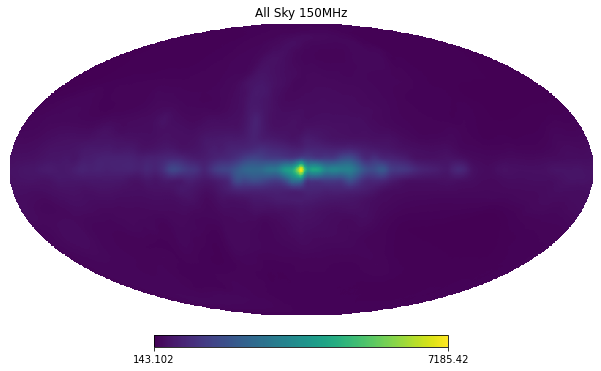

In [2]:
#load the usual suspects

path2maps = '/Users/michael/Research/REACH/amp_scale_factor/chains/Offset_Tests/May/Guzman_map/'

guzman = np.load(os.path.join(path2maps, 'guzman_45.npy'))
base_230 = np.load(os.path.join(path2maps, 'base_map_230.npy'))
guzman_real = np.load(os.path.join(path2maps, 'Guzman_45MHz_base_map.npy'))

#below is only useful for the initial conversion from FITS to ring map
allsky_150MHz = np.load('/Users/michael/Downloads/AllSky_150MHz.npy')
#convert all sky to RING
#allsky_150MHz = hp.pixelfunc.reorder(allsky_150MHz, inp='NEST', out='Ring')
#allsky150MHz_nside512 = hp.pixelfunc.ud_grade(allsky_150MHz, 512)
#save it in ring ordering so I don't have to go through that again
#np.save('allsky_150MHz.npy', allsky150MHz_nside512)

allsky_150MHz = np.load('allsky_150MHz.npy')
hp.visufunc.mollview(allsky_150MHz , title = "All Sky 150MHz")

#means
mean_base_230 = np.mean(base_230)
mean_allsky_150MHz = np.mean(allsky_150MHz)

print(mean_allsky_150MHz)


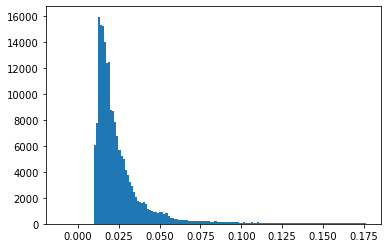

In [4]:
#load the error map
path = '/Users/michael/Downloads/egsm_errorpred_150mhz.npz'
npz = np.load(path)
errors_150MHz = npz['arr_0'] 

pl.hist(errors_150MHz, bins = np.linspace(-np.min(errors_150MHz), np.max(errors_150MHz)/2, 150))
pl.show()
pl.close()

#upgrade to nside = 512
errors150MHz_nside512 = hp.pixelfunc.ud_grade(errors_150MHz, 512)

#convert absolute error map to Kelvin
k = 1.380649e-23 #J/K
c = 3e8 #m/s
nu_obs = 150e6 #Hz
#errors_150MHz = (errors_150MHz*c**2)/(10**6*2*k*nu_obs**2)
#above was a fail, lets use the astropy conversion

#conversion factors
equiv = u.brightness_temperature(150*u.MHz)
beam_area = 1*u.steradian#*(beam_sigma)**2
#go through the entire map and convert each pixel
#for i in range(len(errors_150MHz)):
errors_150MHz = (errors_150MHz*u.MJy/beam_area).to(u.K, equivalencies=equiv).value


#upgrade to nside = 512
errors150MHz_nside512 = hp.pixelfunc.ud_grade(errors_150MHz, 512)

## Compute Fractional Error

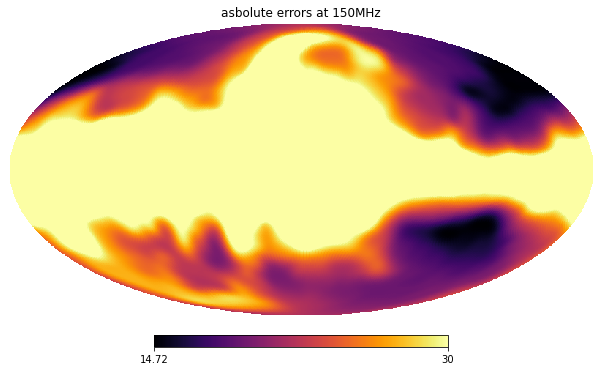

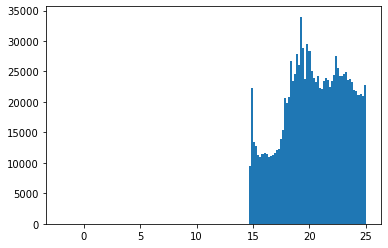

0.1004914466501512

In [36]:
hp.visufunc.mollview(errors150MHz_nside512 , max = 30, cmap = 'inferno',  title = 'asbolute errors at 150MHz')
pl.show()
pl.close()
pl.hist(errors150MHz_nside512, bins = np.linspace(-2, 25, 150))
pl.show()
pl.close()

np.mean(np.true_divide(errors150MHz_nside512, allsky_150MHz))



0.1004914466501512


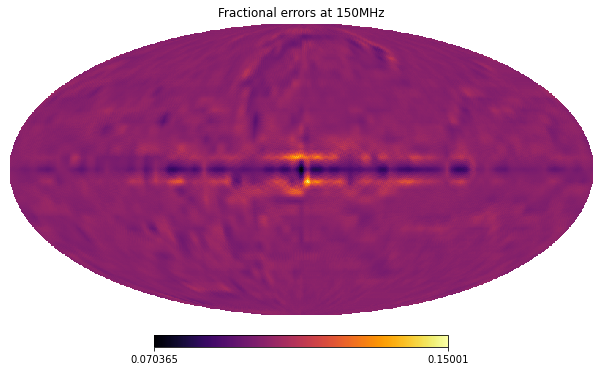

In [7]:
Fractional_errors150MHz = np.true_divide(errors150MHz_nside512, allsky_150MHz)

hp.visufunc.mollview(Fractional_errors150MHz , cmap = 'inferno',  title = 'Fractional errors at 150MHz')

print(np.mean(Fractional_errors150MHz))


## Compute the power spectrum from the errormap


Multipole 24 or in degrees 7.5


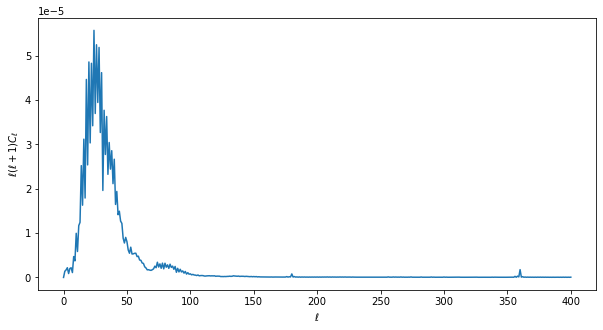

In [8]:
#compute the angular power spectrum of the contrast map

#hp.visufunc.mollview(errors150MHz_nside512, cmap = 'RdBu')

cl = hp.sphtfunc.anafast(Fractional_errors150MHz , lmax = 400)
ell = np.arange(len(cl))

pl.figure(figsize=(10, 5))
pl.plot(ell, ell * (ell + 1) * cl)
pl.xlabel("$\ell$")
pl.ylabel("$\ell(\ell+1)C_{\ell}$")


#next convert multipole moment l to physical length
#first nomarlize the cl 
cl_norm = np.multiply(ell * (ell + 1), cl)

correlation_length = convert_ell_to_degrees(ell[np.argmax(cl_norm)])
print('Multipole ' + str(ell[np.argmax(cl_norm)]) + ' or in degrees ' + str(correlation_length))





# Create a noise realisation from the 150MHz absolute errormap

/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/sphtfunc.py:433: FutureChangeWarning: The order of the input cl's will change in a future release.
Use new=True keyword to start using the new order.
See documentation of healpy.synalm.
  warnings.warn(
/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/sphtfunc.py:822: UserWarning: Sigma is 0.000000 arcmin (0.000000 rad) 
  warnings.warn(
/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/sphtfunc.py:827: UserWarning: -> fwhm is 0.000000 arcmin
  warnings.warn(
/Users/michael/miniconda3/lib/python3.8/site-packages/healpy/projaxes.py:202: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  aximg = self.imshow(


Mean of error map is 0.16323281495783276


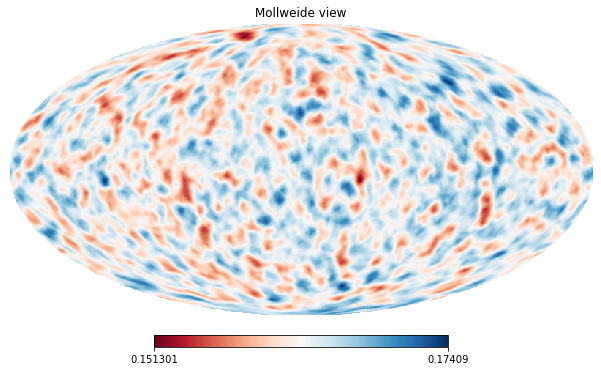

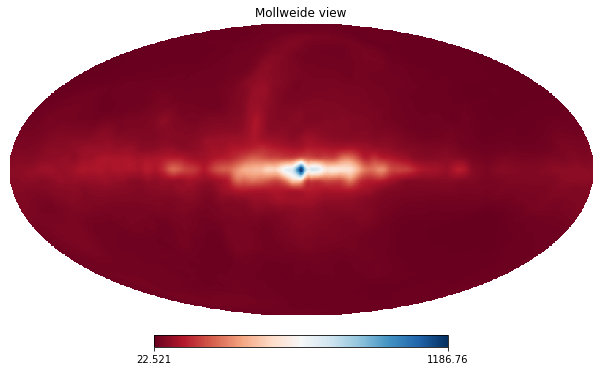

In [9]:
'''
np.random.seed(1)
noise_realisation = hp.synfast(cl, 512)
hp.visufunc.mollview(noise_realisation, cmap = 'RdBu')

print('Mean of error map is ' + str(np.mean(noise_realisation)))

noise_realisation_scaled = np.multiply(noise_realisation, allsky_150MHz)

hp.visufunc.mollview(noise_realisation_scaled, cmap = 'RdBu')
'''



## Scale error map by the 150MHz base map

In [ ]:
noise_realisation_scaled - allsky_150MHz

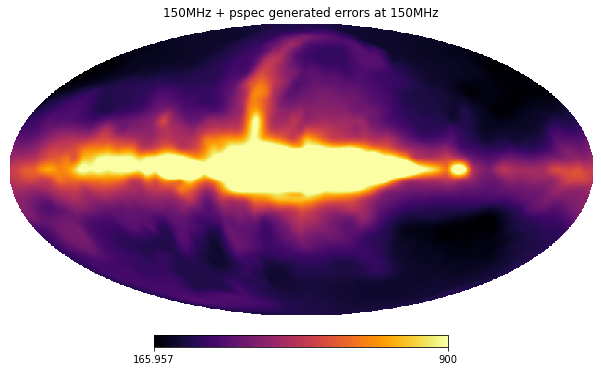

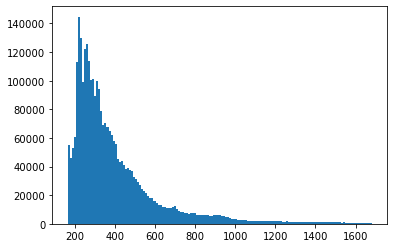

Mean of the noisy map is 465.0430985532435 compared to the original 399.7996


In [12]:
#150Mhz  + noise
allsky_150MHz_wNoise = allsky_150MHz + noise_realisation_scaled

hp.visufunc.mollview(allsky_150MHz_wNoise , cmap = 'inferno', max = 900, title = '150MHz + pspec generated errors at 150MHz')
pl.show()
pl.close()
pl.hist(allsky_150MHz_wNoise, bins = np.linspace(np.min(allsky_150MHz_wNoise),np.max(allsky_150MHz_wNoise)/5., 150))
pl.show()
pl.close()

print('Mean of the noisy map is ' + str(np.mean(allsky_150MHz_wNoise)) + ' compared to the original ' + str(mean_allsky_150MHz) )

#save noise and original
#np.save('allsky_150MHz_wAngularPspecErrorsRayleighJeans_Scaledby150MHzBaseMap.npy', allsky_150MHz_wNoise)
#np.save('allsky_150MHz.npy', allsky_150MHz)
#np.save('AngularPspecErrors_Scaledby150MHzBaseMapRayleighJeans_forAllySky150MHz.npy', noise_realisation_scaled)


Double check that nothing went wrong

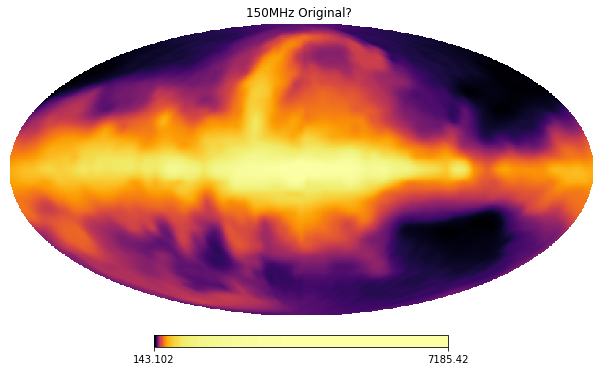

In [13]:


hp.visufunc.mollview(allsky_150MHz_wNoise- noise_realisation_scaled , cmap = 'inferno', norm = 'hist', title = '150MHz Original? ')




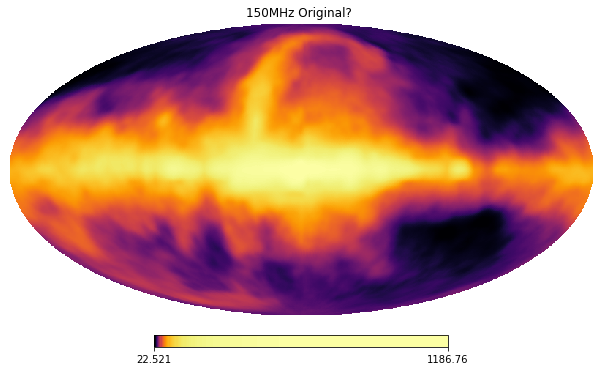

In [9]:
#load above if already ran
noise_realisation_scaled = np.load('AngularPspecErrors_Scaledby150MHzBaseMapRayleighJeans_forAllySky150MHz.npy')
allsky_150MHz_wNoise = np.load('allsky_150MHz_wAngularPspecErrorsRayleighJeans_Scaledby150MHzBaseMap.npy') 

hp.visufunc.mollview(noise_realisation_scaled , cmap = 'inferno', norm = 'hist', title = '150MHz Original? ')

In [ ]:
!open /Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/AllSky150wPspecErrorsDerivedFromFracErrors20percentLarger_fitwAllSky150_Nscafac_1_60MinObs/analysis/total_comparision.pdf

## Generate Percentile Masks (General)

the temperature dividers are  6  long 
The max of the map is  509.37593221329064
dividing percentiles are  1.0
dividing percentiles are  33.0
dividing percentiles are  65.0
dividing percentiles are  97.0
the temperature dividers are  [ 14.71998178  15.02795082  23.80803776  34.9193543  136.55284126
 509.37593221]
values must be between  14.719981783236225  percentile and  15.027950818826625
values must be between  15.027950818826625  percentile and  23.808037757691068
values must be between  23.808037757691068  percentile and  34.919354301887
values must be between  34.919354301887  percentile and  136.55284126349136


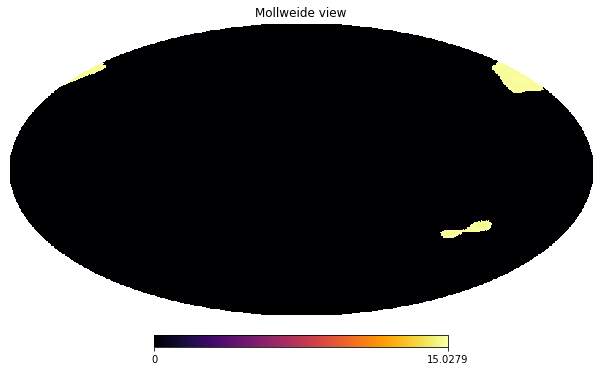

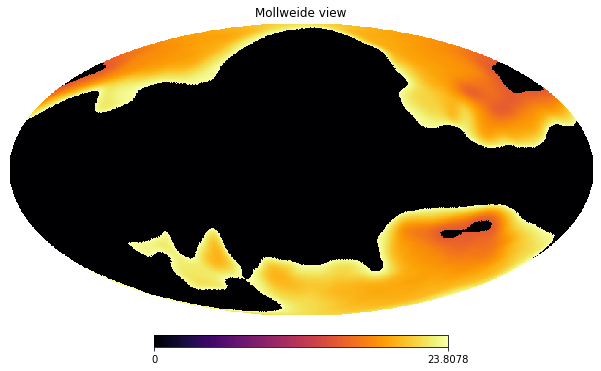

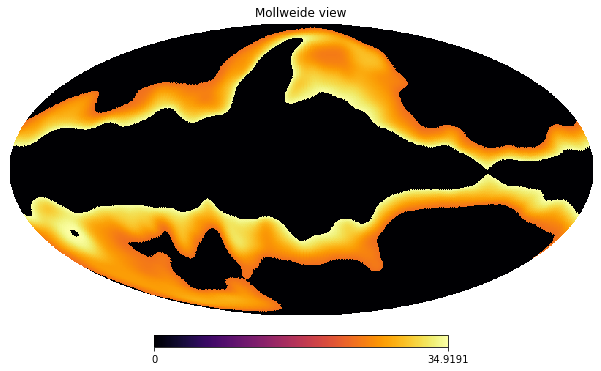

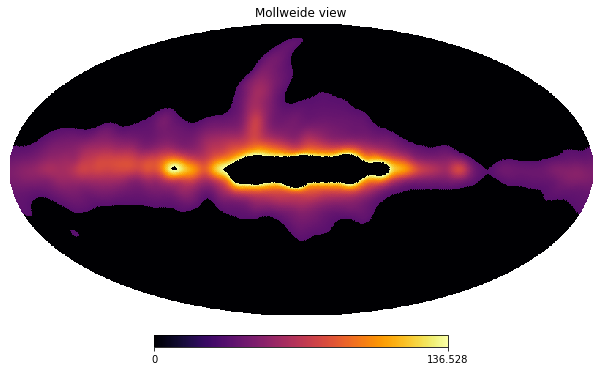

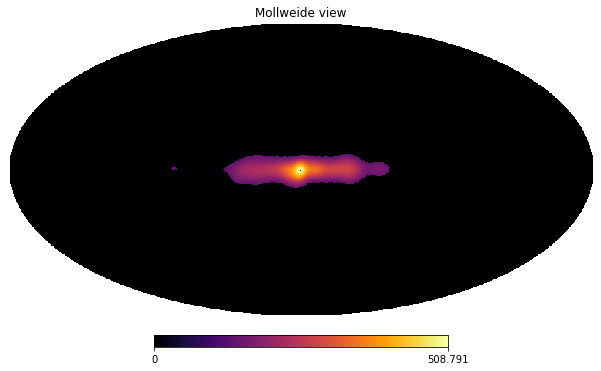

In [114]:
N_reg_scafac = 5
input_map = errors150MHz_nside512 #noise_realisation_scaled

masks5 = np.zeros(( len(input_map), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')

temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
        
print('the temperature dividers are ', temp_divider )
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks5[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )

masks5[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )

    
    
#take a look to see if everything went well
for i in range(N_reg_scafac):
    hp.visufunc.mollview(np.multiply(input_map, masks5[:,i]) , cmap = 'inferno')
    pl.show()
    pl.close()


#np.save('Masks_150MHzPspecErrors_' + str(N_reg_scafac) +'_regions_.npy' , masks)


the temperature dividers are  2  long 
The max of the map is  1192.9313280383378


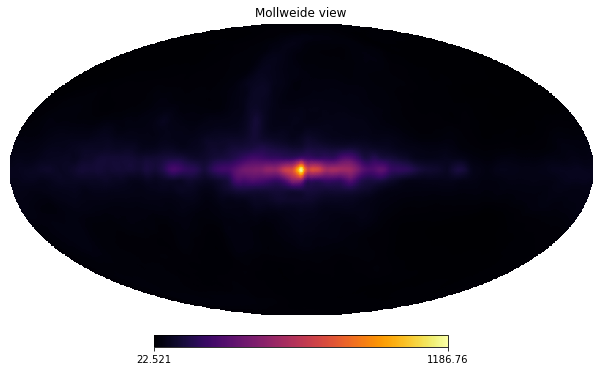

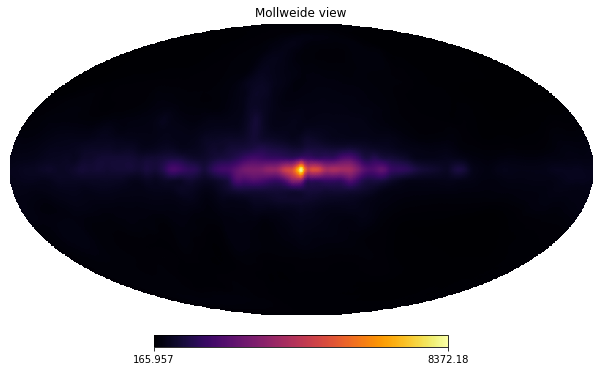

In [18]:
N_reg_scafac = 1
masks = np.zeros((len(allsky_150MHz), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')
temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    print('the temperature dividers are ', temp_divider )
    
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    hp.visufunc.mollview(np.multiply(input_map, masks[:,i]) , cmap = 'inferno')
    pl.show()
    pl.close()
    
    
hp.visufunc.mollview(allsky_150MHz_wNoise , cmap = 'inferno')

# Results 

### Absolute Error Prior Map 

  0.273349625860843E+003
----------------------------------------------------------------------------------
  0.277566383888601E+003
----------------------------------------------------------------------------------
  0.285123612602718E+003
----------------------------------------------------------------------------------
  0.280035370633838E+003
----------------------------------------------------------------------------------
  0.279377084427086E+003
----------------------------------------------------------------------------------
  0.285119828871021E+003
----------------------------------------------------------------------------------
  0.280646643440201E+003
----------------------------------------------------------------------------------


<ipython-input-308-95edad5bd97b>:36: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  scale_factors = np.array(scale_factors)


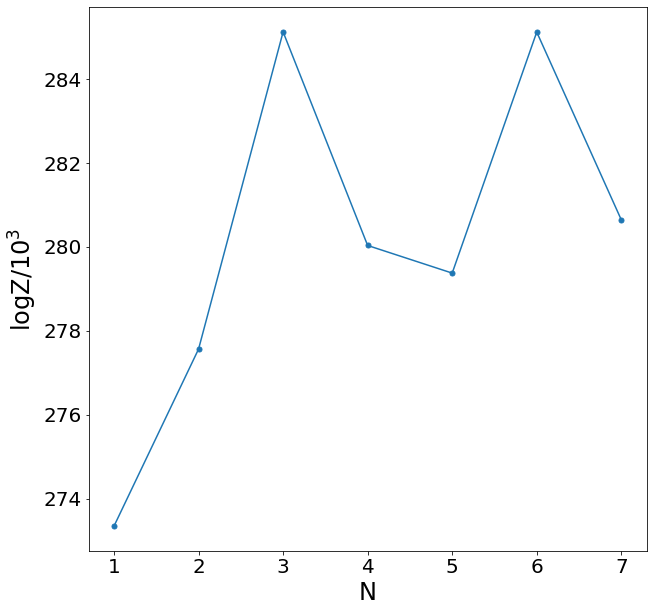

[1.0729883639587, 1.16505556004104, 1.16388665837867] [1.12169848750609, 1.16027427885374, 1.16895679458465, 1.16380643916334, 1.16373898117811, 1.1648341158155]


In [308]:
#where to look for files 
path2files = '/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/ThoroughReRunWithDiffPriorMaps/TightPriorsOnAmps/'
base_dir_name = 'AllSky150wPspecErrorsRayleighJeansScales_fitwAllSky150_60MinObs_AbsoluteErrorMapAsMaskTightPriorMap_N_scafac_'

#how many directories do we need to run the loop for?
N_range = np.linspace(1, 7,7)

#initialize arrays to store the relevant information
logZs = np.zeros_like(N_range)
scale_factors = []

base_dir_name = [base_dir_name +  str(N_range[i]).strip(".0") for i in range(len(N_range))  ]
#print(base_dir_name)
for i in range(len(N_range)):
    f = open(os.path.join(path2files,base_dir_name[i] , 'test.stats'), 'r') 
    lines = f.read()
    r = lines.find('log(Z)       =')
    print(lines[r+15:r + 39])
    logZs[i]  = float(lines[r+15:r + 40])
    
    scafacs = []
    #i = 0 corresponds to 1 dim
    print('----------------------------------------------------------------------------------')
    for j in range(i + 1 ):
        #which dim in test.stats are we reading?
        digit = str(j + 2).strip(".0")
        r = lines.find(digit + '  0.')
        #print('file ', os.path.join(path2files,base_dir_name[i]),  'dim ' , float(lines[r + 3:r + 25]))
        scafacs.append(float(lines[r+ 3:r + 25]))
    scale_factors.append(scafacs)
        
        
    f.close()
    

scale_factors = np.array(scale_factors)   


pl.figure(figsize = (10,10))
pl.ylabel(r'logZ/10$^3$', fontsize = 24)
pl.xlabel(r'N', fontsize = 24)
pl.plot(N_range,logZs, marker = 'o', markersize = 5)
pl.xticks(fontsize = 20)
pl.yticks(fontsize = 20)
pl.show()

#the weird up and down makes sense in this case, at 3 regions it doesn't need T21 anymore for ?? reasons
#while we know that 5 regions is enough to do the trick in a more sensible way. 
print(scale_factors[2], scale_factors[5])

## Generate Masks from Asbolute Error Prior Map

the temperature dividers are  7  long 
The max of the map is  509.37593221329064
dividing percentiles are  1.0
dividing percentiles are  25.0
dividing percentiles are  49.0
dividing percentiles are  73.0
dividing percentiles are  97.0
the temperature dividers are  [ 14.71998178  15.02795082  21.95340719  28.22850707  40.04430215
 136.55284126 509.37593221]
values must be between  14.719981783236225  percentile and  15.027950818826625
values must be between  15.027950818826625  percentile and  21.95340719461984
values must be between  21.95340719461984  percentile and  28.228507070813013
values must be between  28.228507070813013  percentile and  40.04430215021117
values must be between  40.04430215021117  percentile and  136.55284126349136
Data map mean  1.7200810694799638  original map mean  1.4794466012584355
Ratio of 1.1626516753067273


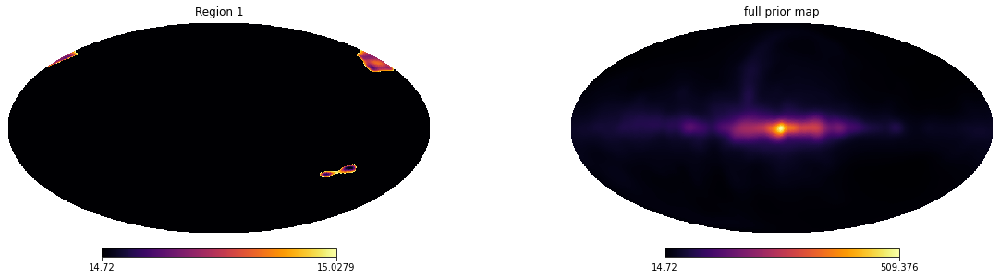

Data map mean  52.907704385047936  original map mean  45.47413573656619
Ratio of 1.1634680577888221


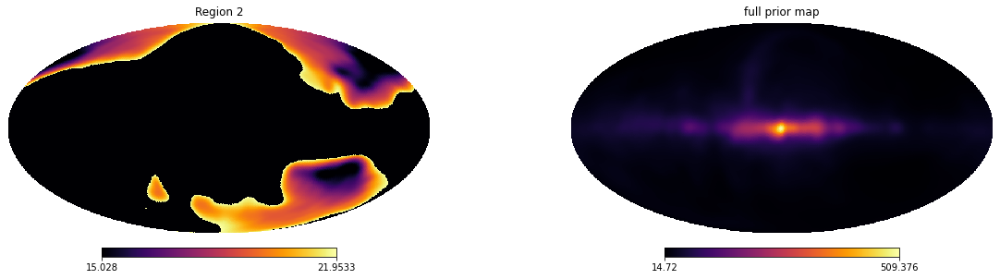

Data map mean  69.3998012102147  original map mean  59.66908090681924
Ratio of 1.163078099335755


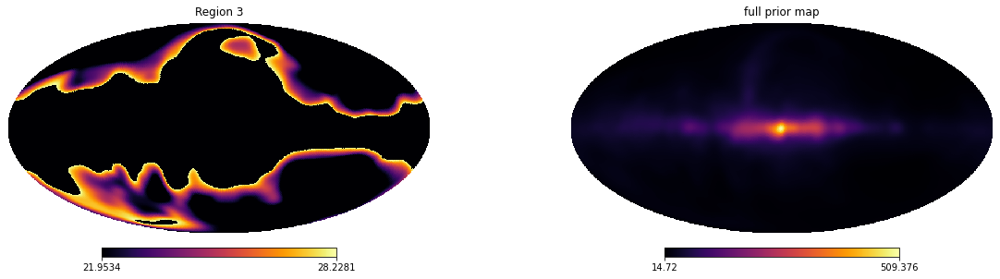

Data map mean  92.93446775545759  original map mean  79.88953496015165
Ratio of 1.1632871289313758


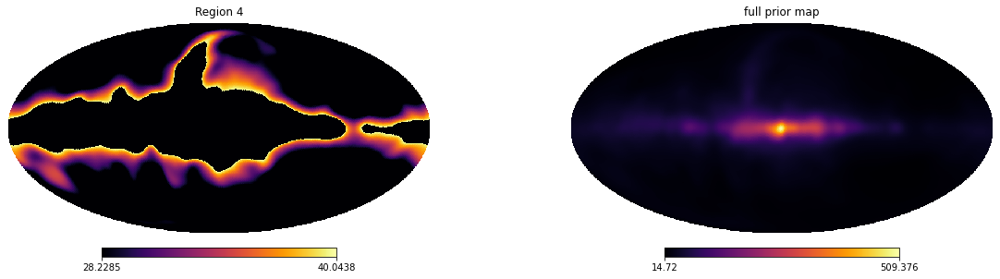

Data map mean  168.70719686161567  original map mean  145.04502639671168
Ratio of 1.1631367241796058


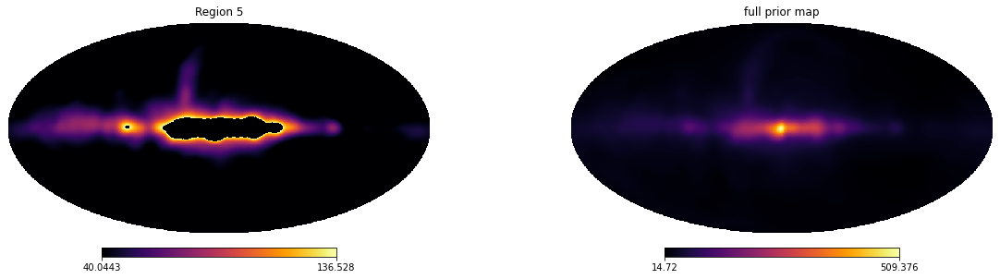

Data map mean  79.3322709985729  original map mean  68.20658975133362
Ratio of 1.1631173950757703


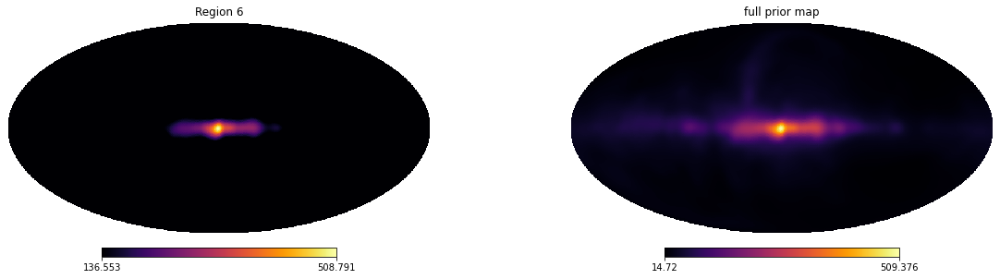

In [302]:
#okay so that is the fractional error map? What about if we used the absolute error map as the prior?
N_reg_scafac = 6
input_map = errors150MHz_nside512

masks = np.zeros((len(input_map), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')

temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    
print('the temperature dividers are ', temp_divider )
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    masked = np.multiply(errors150MHz_nside512 , masks[:,i])
    minval = np.min(masked.flatten()[np.nonzero(masked.flatten())])
    maxval = np.max(masked.flatten()[np.nonzero(masked.flatten())])
    print('Data map mean ', np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i])), ' original map mean ', np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    print('Ratio of' , np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i]))/np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    fig, (ax1, ax2) = pl.subplots(ncols=2, figsize = (20,5))
    pl.axes(ax1)
    hp.visufunc.mollview(np.multiply(errors150MHz_nside512 ,  masks[:,i]) , min = minval, title = 'Region ' + str(i + 1), hold = True, cmap = 'inferno')
    pl.axes(ax2)
    hp.visufunc.mollview(errors150MHz_nside512  , hold = True, title = 'full prior map' , cmap = 'inferno')
    pl.show()
    pl.close()

In [303]:



print(scale_factors[N_reg_scafac - 1], masks.shape)

reconstructor_object = Reconstructor(scale_factors[N_reg_scafac -1 ], allsky_150MHz, masks, return_residuals = True)
reconstructor_object.reconstruct_map_notfromscratch()



reconstructor_object.plot(allsky_150MHz_wNoise)



IndexError: index 5 is out of bounds for axis 0 with size 0

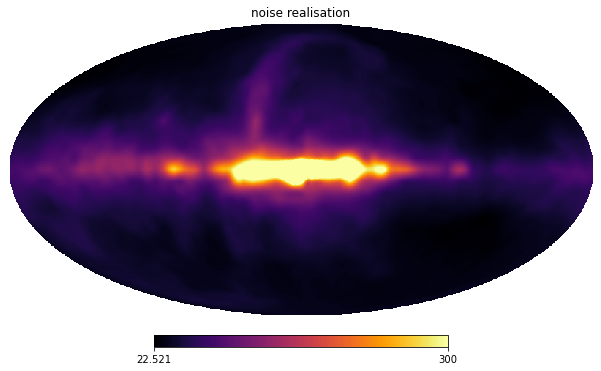

In [289]:

hp.visufunc.mollview(cedar_noise , max = 300, title = 'noise realisation' , cmap = 'inferno')


#so one method it gets the noise added on top while the other method knows about the fractional amount

## Fractional Error Prior Map

In [309]:
#where to look for files 
path2files = '/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/ThoroughReRunWithDiffPriorMaps/TightPriorsOnAmps/'
base_dir_name = 'AllSky150wPspecErrorsRayleighJeansScales_fitwAllSky150_60MinObs_FractionalErrorMapAsMaskTightPriorMap_N_scafac_'

#how many directories do we need to run the loop for?
N_range = np.linspace(1, 5,5)

#initialize arrays to store the relevant information
logZs = np.zeros_like(N_range)
scale_factors = []

base_dir_name = [base_dir_name +  str(N_range[i]).strip(".0") for i in range(len(N_range))  ]
#print(base_dir_name)
for i in range(len(N_range)):
    f = open(os.path.join(path2files,base_dir_name[i] , 'test.stats'), 'r') 
    lines = f.read()
    r = lines.find('log(Z)       =')
    #print(lines[r+15:r + 39])
    logZs[i]  = float(lines[r+15:r + 40])
    
    scafacs = []
    #i = 0 corresponds to 1 dim
    print('----------------------------------------------------------------------------------')
    for j in range(i + 1 ):
        #which dim in test.stats are we reading?
        digit = str(j + 2).strip(".0")
        r = lines.find(digit + '  0.')
        #print('file ', os.path.join(path2files,base_dir_name[i]),  'dim ' , float(lines[r + 3:r + 25]))
        scafacs.append(float(lines[r+ 3:r + 25]))
    scale_factors.append(scafacs)
        
        
    f.close()
    

scale_factors = np.array(scale_factors)   


pl.figure(figsize = (10,10))
pl.ylabel(r'log(Z)$', fontsize = 24)
pl.xlabel(r'N', fontsize = 24)
pl.plot(N_range,logZs, marker = 'o', markersize = 5)
pl.xticks(fontsize = 20)
pl.yticks(fontsize = 20)
pl.show()

#the weird up and down makes sense in this case, at 3 regions it doesn't need T21 anymore for ?? reasons
#while we know that 5 regions is enough to do the trick in a more sensible way. 
print(scale_factors[2], scale_factors[4])

FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/ThoroughReRunWithDiffPriorMaps/TightPriorsOnAmps/AllSky150wPspecErrorsRayleighJeansScales_fitwAllSky150_60MinObs_FractionalErrorMapAsMaskTightPriorMap_N_scafac_1/test.stats'

## Generate Masks from Fractional Error Prior Map

the temperature dividers are  6  long 
The max of the map is  1.1741120831085399
dividing percentiles are  1.0
dividing percentiles are  33.0
dividing percentiles are  65.0
dividing percentiles are  97.0
the temperature dividers are  [1.15124981 1.15674138 1.16198275 1.16433546 1.16843127 1.17411208]
values must be between  1.1512498127217219  percentile and  1.1567413774994824
values must be between  1.1567413774994824  percentile and  1.161982747642852
values must be between  1.161982747642852  percentile and  1.164335456092035
values must be between  1.164335456092035  percentile and  1.168431271520086
Data map mean  4.903784297912029  original map mean  4.243357478553662
Ratio of 1.1556377992418099


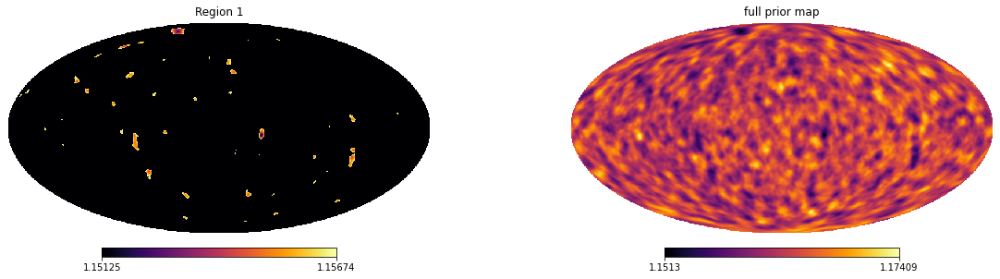

Data map mean  148.9972026816236  original map mean  128.4104848526234
Ratio of 1.1603196020373847


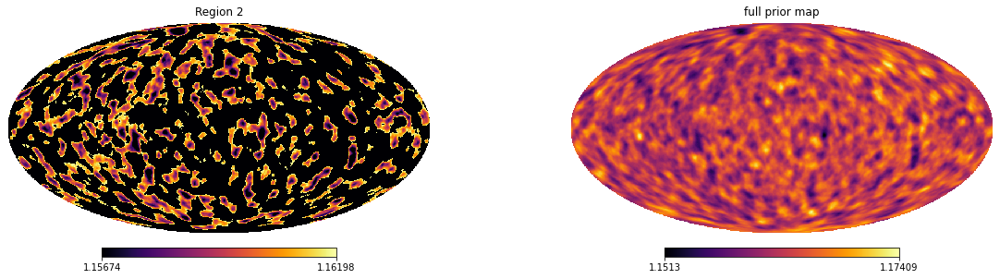

Data map mean  152.67509513613274  original map mean  131.2575443345122
Ratio of 1.1631719602115786


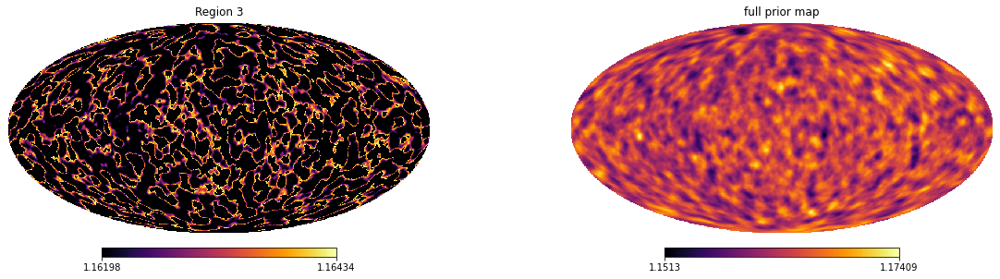

Data map mean  145.71992856147241  original map mean  124.98783425095219
Ratio of 1.1658728982285913


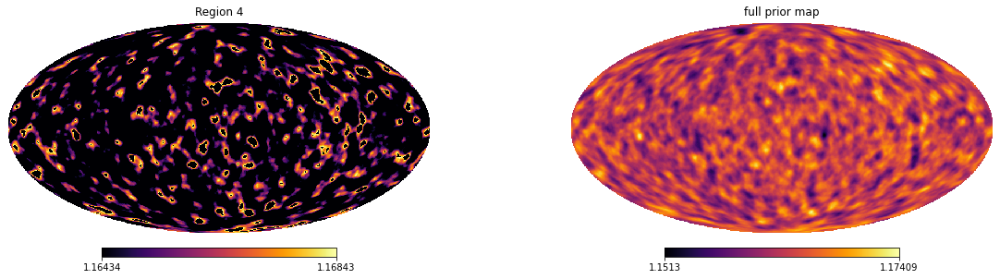

Data map mean  12.747018370348085  original map mean  10.900220222048423
Ratio of 1.169427599688679


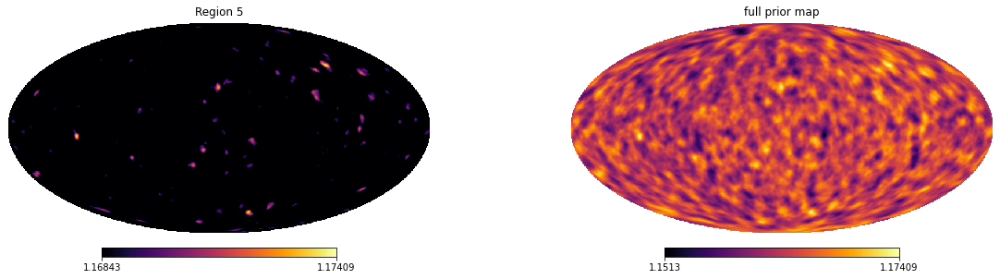

In [264]:
#amplitude pertubations
input_map = np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar) 
#frac error
#input_map = errors150MHz_nside512
N_reg_scafac = 5

masks = np.zeros((len(input_map), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')

temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    
print('the temperature dividers are ', temp_divider )
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    masked = np.multiply(np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar) , masks[:,i])
    minval = np.min(masked.flatten()[np.nonzero(masked.flatten())])
    maxval = np.max(masked.flatten()[np.nonzero(masked.flatten())])
    print('Data map mean ', np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i])), ' original map mean ', np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    print('Ratio of' , np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i]))/np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    fig, (ax1, ax2) = pl.subplots(ncols=2, figsize = (20,5))
    pl.axes(ax1)
    hp.visufunc.mollview(np.multiply(np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar) ,  masks[:,i]) , min = minval, hold = True, title = 'Region ' + str(i + 1), cmap = 'inferno')
    pl.axes(ax2)
    hp.visufunc.mollview(np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar)  , hold = True, title = 'full prior map' , cmap = 'inferno')
    pl.show()
    pl.close()
    

[1.08925749269421, 1.17025433245092, 1.15921739612698, 1.16564403253013, 1.18017979318348] (3145728, 5)


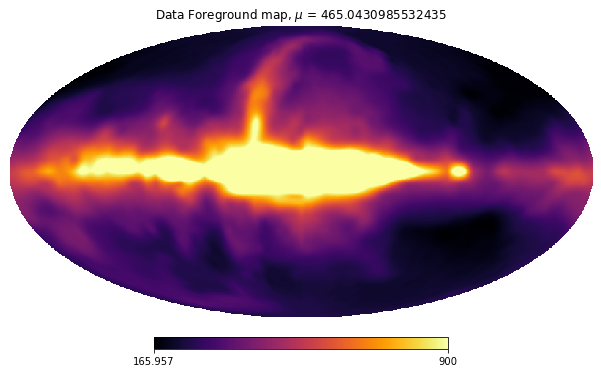

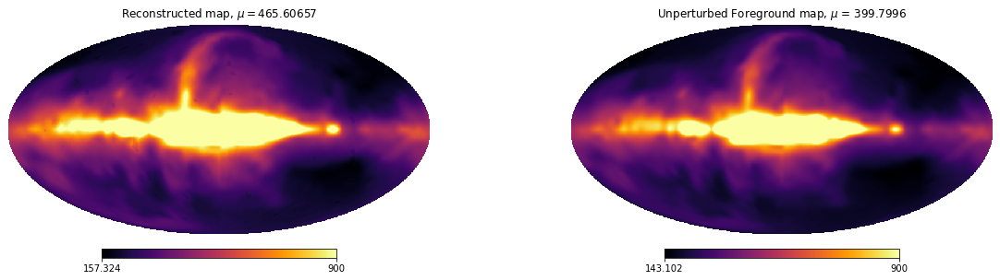

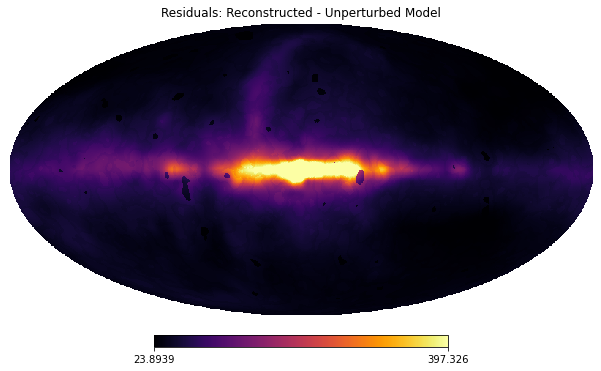

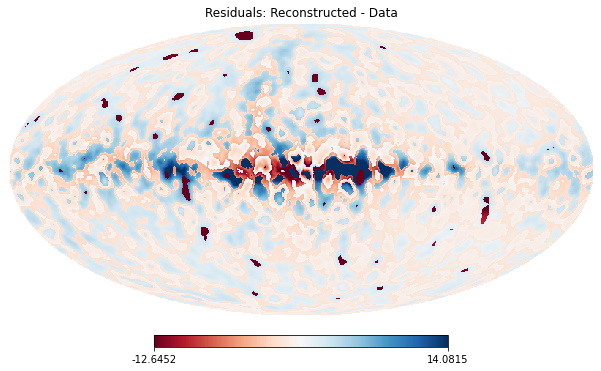

In [268]:
print(scale_factors[N_reg_scafac - 1], masks.shape)

reconstructor_object = Reconstructor(scale_factors[N_reg_scafac -1 ], allsky_150MHz, masks, return_residuals = True)
reconstructor_object.reconstruct_map_notfromscratch()



reconstructor_object.plot(allsky_150MHz_wNoise)


# No T21 in models

### Absolute/Fractional Error Prior Map

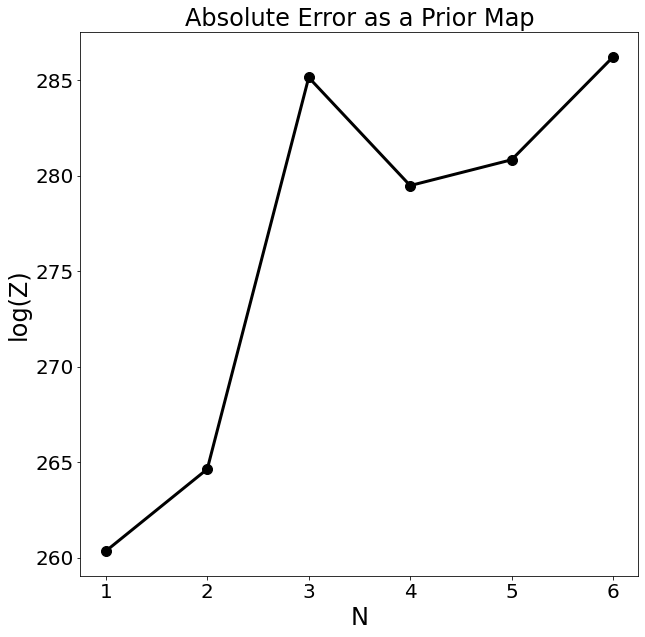

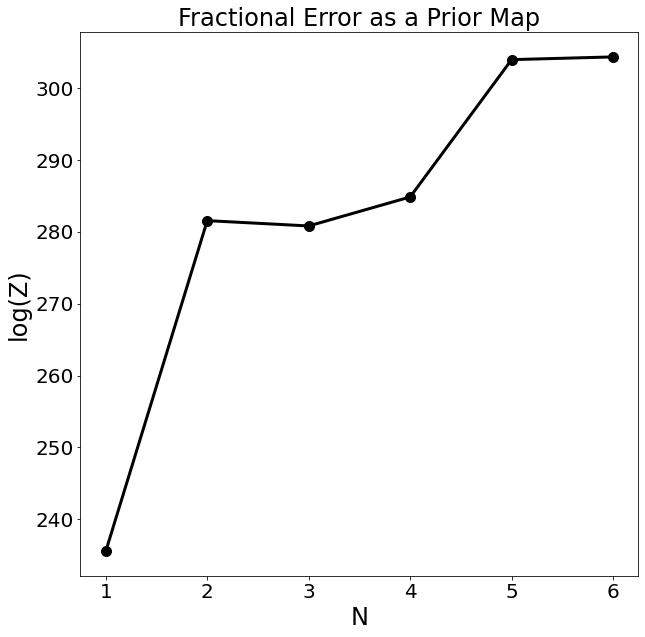

In [299]:
#where to look for files 
path2files = '/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/ThoroughReRunWithDiffPriorMaps/TightPriorsOnAmps/noT21/'
base_dir_name = 'noT21_AllSky150wPspecErrorsRayleighJeansScales_fitwAllSky150_60MinObs_AbsoluteErrorMapAsMaskTightPriorMap_N_scafac_'

#how many directories do we need to run the loop for?
N_range = np.linspace(1, 6,6)

#initialize arrays to store the relevant information
logZs = np.zeros_like(N_range)
scale_factors = []

base_dir_name = [base_dir_name +  str(N_range[i]).strip(".0") for i in range(len(N_range))  ]
#print(base_dir_name)
for i in range(len(N_range)):
    f = open(os.path.join(path2files,base_dir_name[i] , 'test.stats'), 'r') 
    lines = f.read()
    r = lines.find('log(Z)       =')
    #print(lines[r+15:r + 39])
    logZs[i]  = float(lines[r+15:r + 40])
    

        
    f.close()
    

scale_factors = np.array(scale_factors)   


pl.figure(figsize = (10,10))
pl.title(r'Absolute Error as a Prior Map', fontsize = 24)
pl.ylabel(r'log(Z)', fontsize = 24)
pl.xlabel(r'N', fontsize = 24)
pl.plot(N_range,logZs, marker = 'o',markersize = 10, linewidth = 3, color = 'k')
pl.xticks(fontsize = 20)
pl.yticks(fontsize = 20)
pl.show()


#where to look for files 
path2files = '/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/ThoroughReRunWithDiffPriorMaps/TightPriorsOnAmps/noT21/'
base_dir_name = 'noT21_AllSky150wPspecErrorsRayleighJeansScales_fitwAllSky150_60MinObs_FractionalErrorMapAsMaskTightPriorMap_N_scafac_'

#how many directories do we need to run the loop for?
N_range = np.linspace(1, 6,6)

#initialize arrays to store the relevant information
logZs = np.zeros_like(N_range)
scale_factors = []

base_dir_name = [base_dir_name +  str(N_range[i]).strip(".0") for i in range(len(N_range))  ]
#print(base_dir_name)
for i in range(len(N_range)):
    f = open(os.path.join(path2files,base_dir_name[i] , 'test.stats'), 'r') 
    lines = f.read()
    r = lines.find('log(Z)       =')
    #print(lines[r+15:r + 39])
    logZs[i]  = float(lines[r+15:r + 40])
    

        
    f.close()
    

scale_factors = np.array(scale_factors)   


pl.figure(figsize = (10,10))
pl.title(r'Fractional Error as a Prior Map', fontsize = 24)
pl.ylabel(r'log(Z)', fontsize = 24)
pl.xlabel(r'N', fontsize = 24)
pl.plot(N_range,logZs, marker = 'o', markersize = 10, linewidth = 3, color = 'k')
pl.xticks(fontsize = 20)
pl.yticks(fontsize = 20)
pl.show()



# Start sanity checks

In [ ]:
'''
noise = np.load('/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/AngularPspecErrors_Scaledby150MHzBaseMapRayleighJeans_forAllySky150MHz.npy')
observation_data = np.load('/Volumes/Tubster/REACH/150MHz/AngPSpec150MHz_Errors/RayleighJeans/allsky_150MHz_wAngularPspecErrorsRayleighJeans_Scaledby150MHzBaseMap.npy')
Allsky_150_wNoise = allsky_150MHz + noise
'''

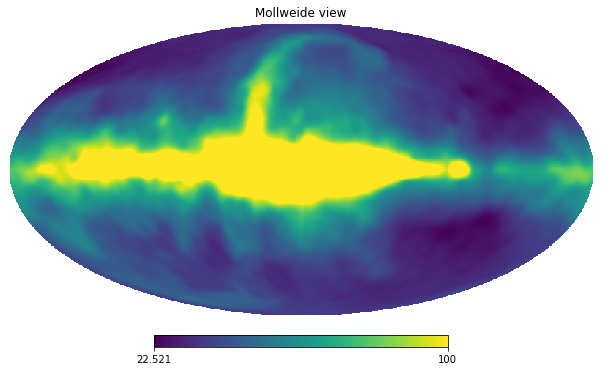

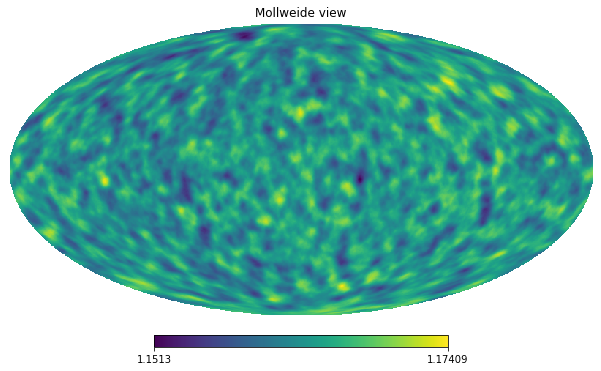

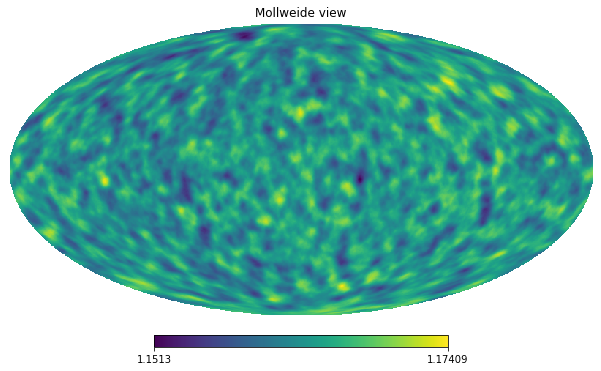

In [11]:
cedar_noise = np.load('/users/michael/Downloads/AngularPspecErrors_Scaledby150MHzBaseMapRayleighJeans_forAllySky150MHz.npy')
hp.visufunc.mollview(cedar_noise, max = 100)

#print(np.where(cedar_noise - noise_realisation_scaled != 0))

#print(np.where(cedar_noise + allsky_150MHz - Allsky_150_wNoise))

frac = np.true_divide( allsky_150MHz + cedar_noise, allsky_150MHz)
hp.visufunc.mollview(frac )

frac = np.true_divide( allsky_150MHz_wNoise, allsky_150MHz)
hp.visufunc.mollview(frac )

(array([], dtype=int64),)
(array([], dtype=int64),)


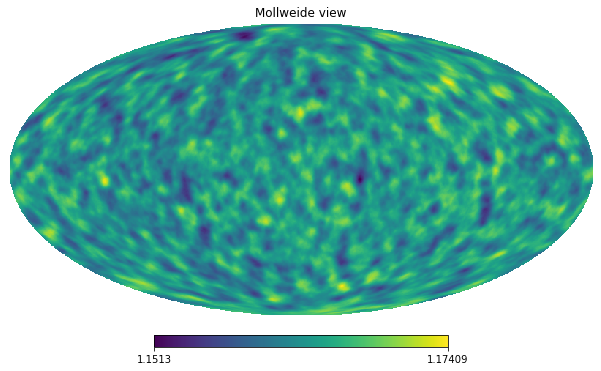

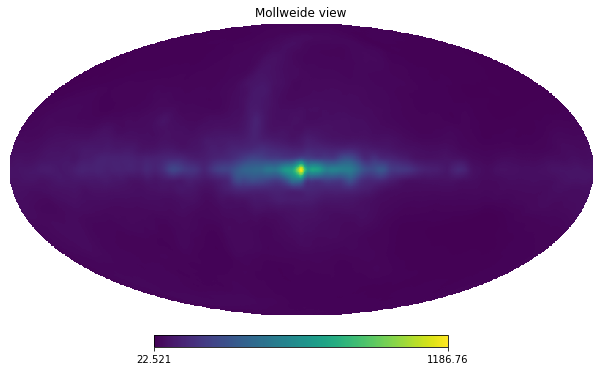

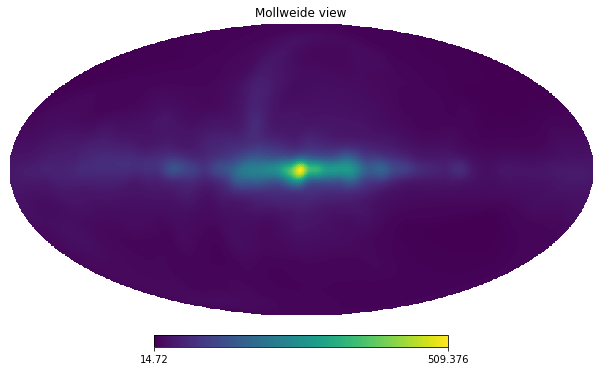

In [12]:
noise_cedar = np.load('/users/michael/Downloads/Debug_150/AngularPspecErrors_Scaledby150MHzBaseMapRayleighJeans_forAllySky150MHz.npy')


basemap_cedar = np.load('/users/michael/Downloads/Debug_150/allsky_150MHz.npy')

obs_data = np.load('allsky_150MHz_wAngularPspecErrorsRayleighJeans_Scaledby150MHzBaseMap.npy')

#double check

print(np.where( np.subtract(basemap_cedar , allsky_150MHz) != 0))

print(np.where(np.subtract(noise_cedar, noise_realisation_scaled) !=0  ))


hp.visufunc.mollview( np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar)  )


hp.visufunc.mollview( np.subtract(obs_data,basemap_cedar) )  

hp.visufunc.mollview(  errors150MHz_nside512)  


### Fractional Error Prior Map

the temperature dividers are  11  long 
The max of the map is  1.1741120831085399
dividing percentiles are  1.0
dividing percentiles are  13.0
dividing percentiles are  25.0
dividing percentiles are  37.0
dividing percentiles are  49.0
dividing percentiles are  61.0
dividing percentiles are  73.0
dividing percentiles are  85.0
dividing percentiles are  97.0
the temperature dividers are  [1.15124981 1.15674138 1.16006965 1.16132445 1.16229243 1.16317612
 1.16404174 1.1649664  1.16614037 1.16843127 1.17411208]
values must be between  1.1512498127217219  percentile and  1.1567413774994824
values must be between  1.1567413774994824  percentile and  1.1600696479490242
values must be between  1.1600696479490242  percentile and  1.1613244520162302
values must be between  1.1613244520162302  percentile and  1.1622924302662483
values must be between  1.1622924302662483  percentile and  1.1631761194807606
values must be between  1.1631761194807606  percentile and  1.1640417391089495
values must 

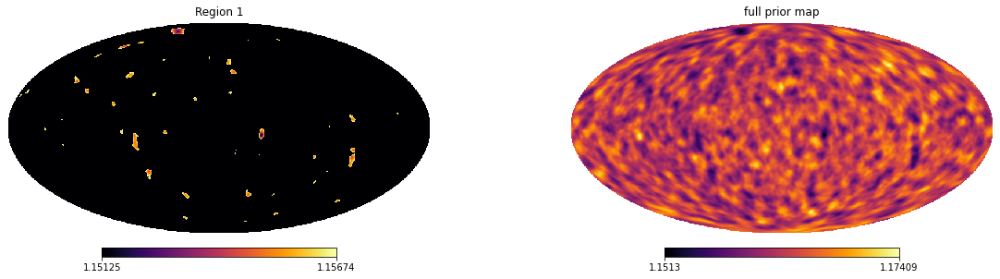

Data map mean  54.1299890646057  original map mean  46.707006992165894
Ratio of 1.1589265198192822


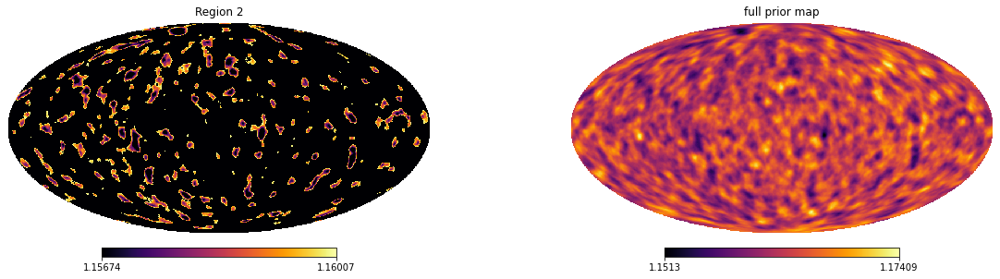

Data map mean  56.6590237971057  original map mean  48.81240164145129
Ratio of 1.1607505857485014


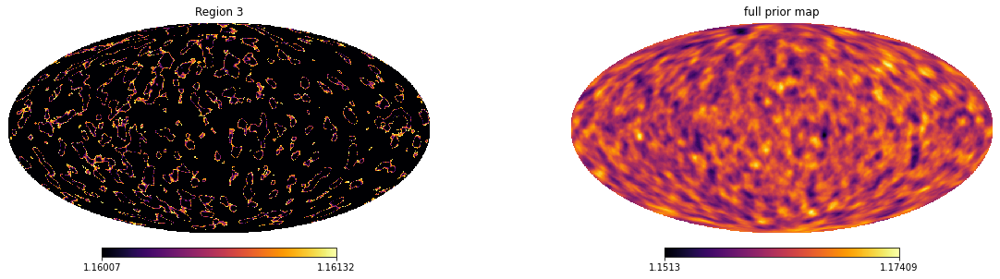

Data map mean  57.11951235163583  original map mean  49.16395084362497
Ratio of 1.1618169689680757


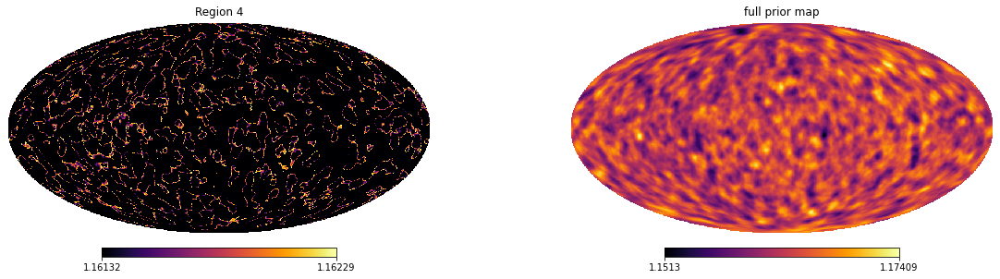

Data map mean  57.3278149812239  original map mean  49.303992530185496
Ratio of 1.162741839743018


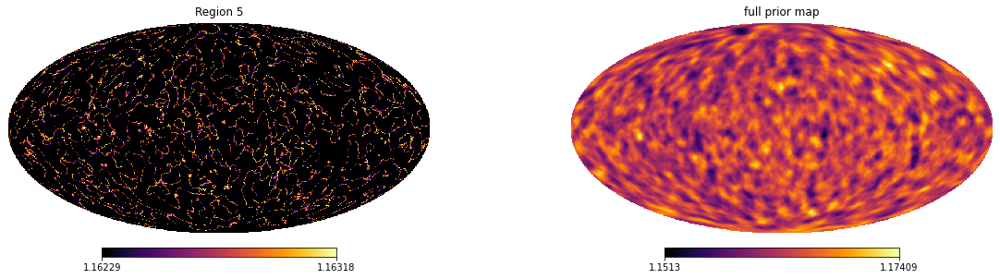

Data map mean  57.62268983748306  original map mean  49.52067551696382
Ratio of 1.1636087197102918


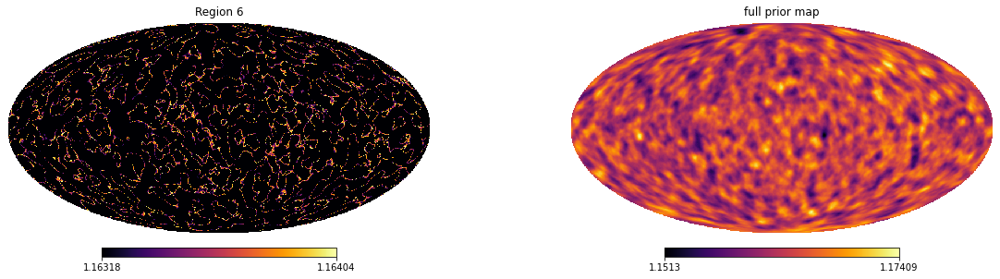

Data map mean  55.57325038975089  original map mean  47.723288905239315
Ratio of 1.1644891134829092


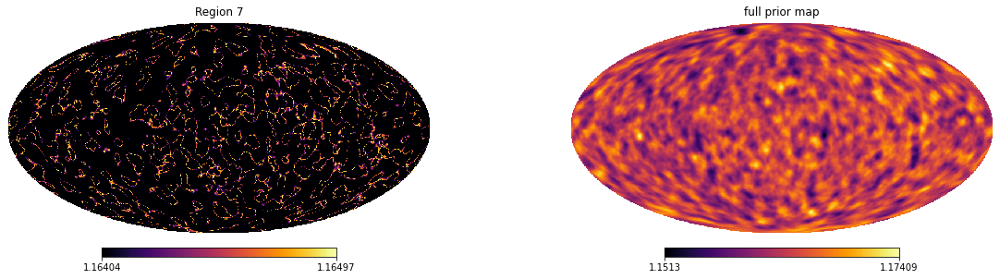

Data map mean  55.05911870779956  original map mean  47.24002557983234
Ratio of 1.1655183931844724


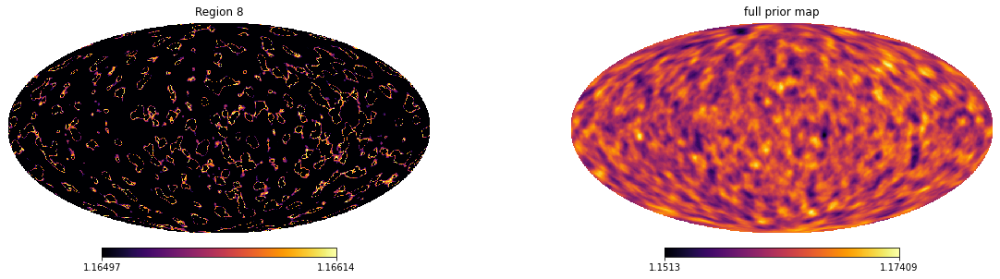

Data map mean  53.90082724962398  original map mean  46.18452142862467
Ratio of 1.1670755825179304


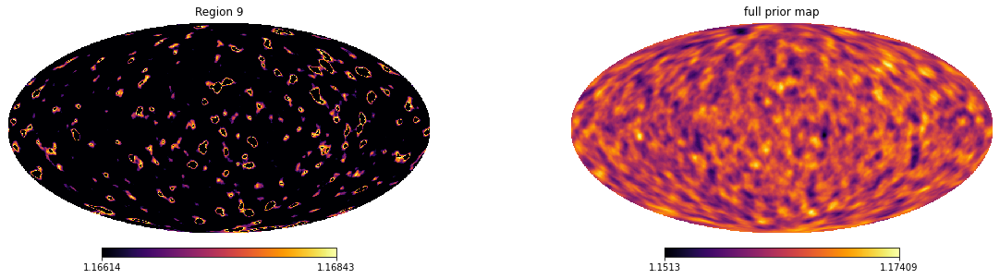

Data map mean  12.747018370348085  original map mean  10.900220222048423
Ratio of 1.169427599688679


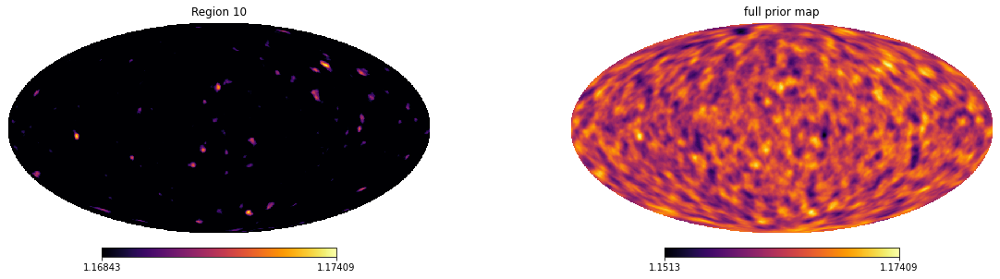

In [172]:
#amplitude pertubations
input_map = np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar) 
#frac error
#input_map = errors150MHz_nside512
N_reg_scafac = 10

masks = np.zeros((len(input_map), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')

temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    
print('the temperature dividers are ', temp_divider )
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    masked = np.multiply(np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar) , masks[:,i])
    minval = np.min(masked.flatten()[np.nonzero(masked.flatten())])
    maxval = np.max(masked.flatten()[np.nonzero(masked.flatten())])
    print('Data map mean ', np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i])), ' original map mean ', np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    print('Ratio of' , np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i]))/np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    fig, (ax1, ax2) = pl.subplots(ncols=2, figsize = (20,5))
    pl.axes(ax1)
    hp.visufunc.mollview(np.multiply(np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar) ,  masks[:,i]) , min = minval, hold = True, title = 'Region ' + str(i + 1), cmap = 'inferno')
    pl.axes(ax2)
    hp.visufunc.mollview(np.true_divide(np.add(noise_cedar,basemap_cedar  ),basemap_cedar)  , hold = True, title = 'full prior map' , cmap = 'inferno')
    pl.show()
    pl.close()
    
    
    
    

### Absolute Error Prior Map

the temperature dividers are  11  long 
The max of the map is  1.1741120831085399
dividing percentiles are  1.0
dividing percentiles are  13.0
dividing percentiles are  25.0
dividing percentiles are  37.0
dividing percentiles are  49.0
dividing percentiles are  61.0
dividing percentiles are  73.0
dividing percentiles are  85.0
dividing percentiles are  97.0
the temperature dividers are  [1.15124981 1.15674138 1.16006965 1.16132445 1.16229243 1.16317612
 1.16404174 1.1649664  1.16614037 1.16843127 1.17411208]
values must be between  1.1512498127217219  percentile and  1.1567413774994824
values must be between  1.1567413774994824  percentile and  1.1600696479490242
values must be between  1.1600696479490242  percentile and  1.1613244520162302
values must be between  1.1613244520162302  percentile and  1.1622924302662483
values must be between  1.1622924302662483  percentile and  1.1631761194807606
values must be between  1.1631761194807606  percentile and  1.1640417391089495
values must 

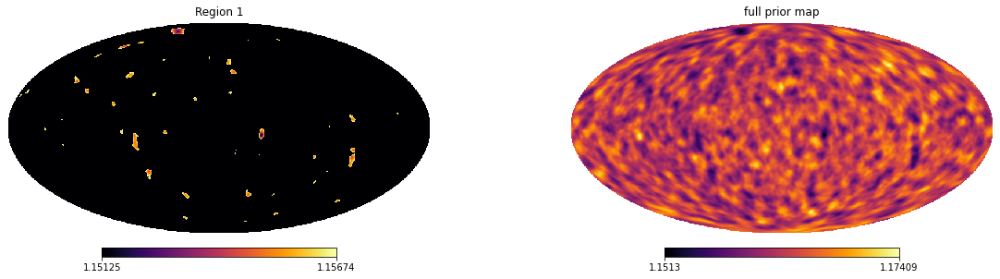

Data map mean  54.1299890646057  original map mean  46.707006992165894
Ratio of 1.1589265198192822


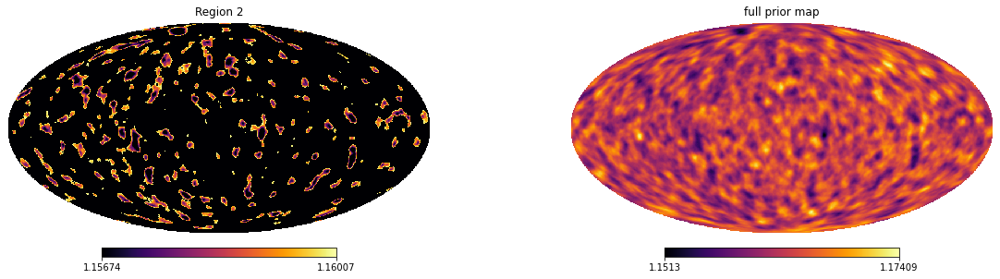

Data map mean  56.6590237971057  original map mean  48.81240164145129
Ratio of 1.1607505857485014


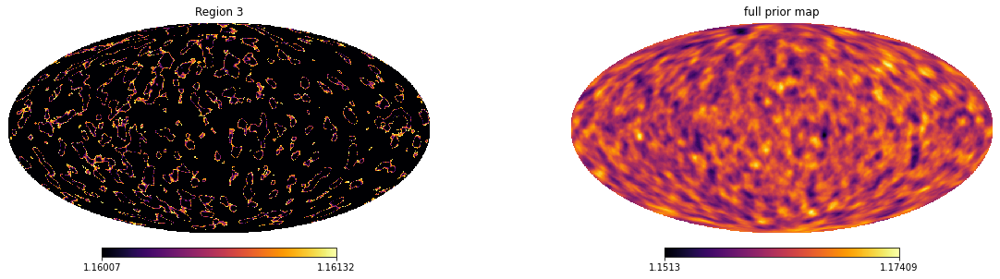

Data map mean  57.11951235163583  original map mean  49.16395084362497
Ratio of 1.1618169689680757


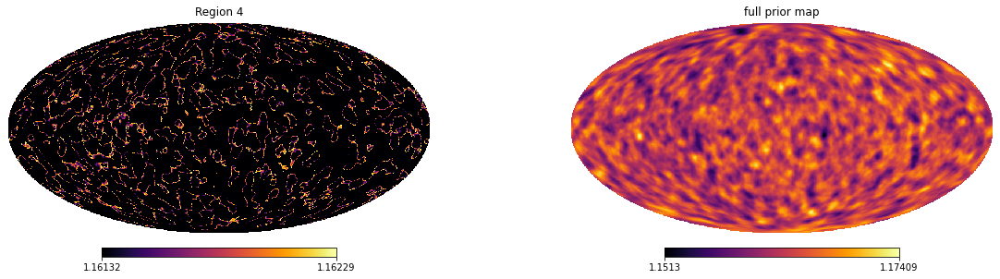

Data map mean  57.3278149812239  original map mean  49.303992530185496
Ratio of 1.162741839743018


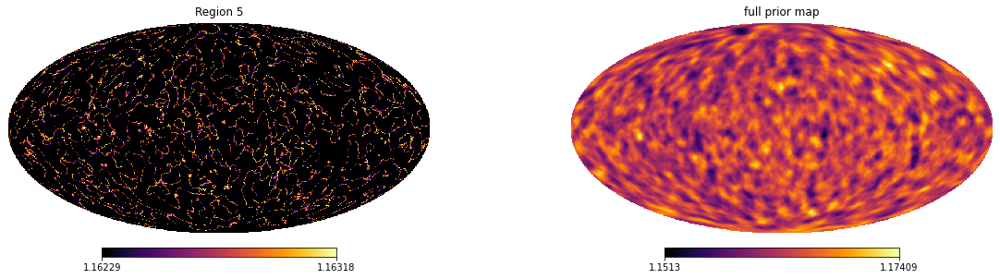

Data map mean  57.62268983748306  original map mean  49.52067551696382
Ratio of 1.1636087197102918


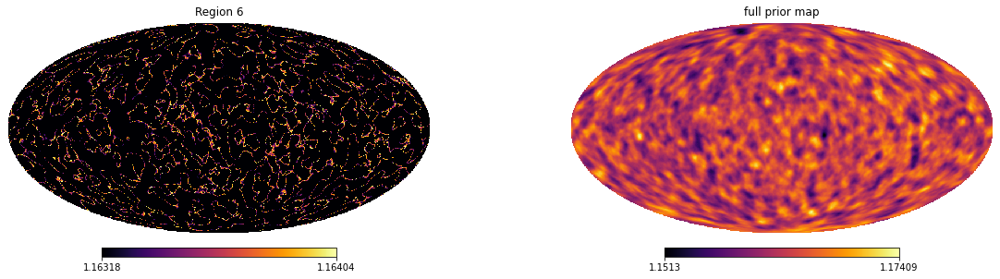

Data map mean  55.57325038975089  original map mean  47.723288905239315
Ratio of 1.1644891134829092


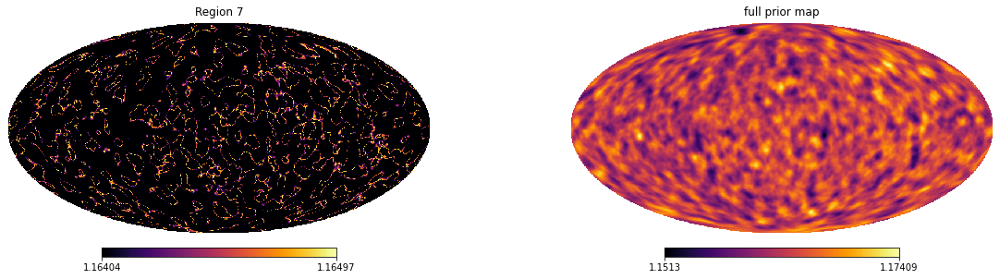

Data map mean  55.05911870779956  original map mean  47.24002557983234
Ratio of 1.1655183931844724


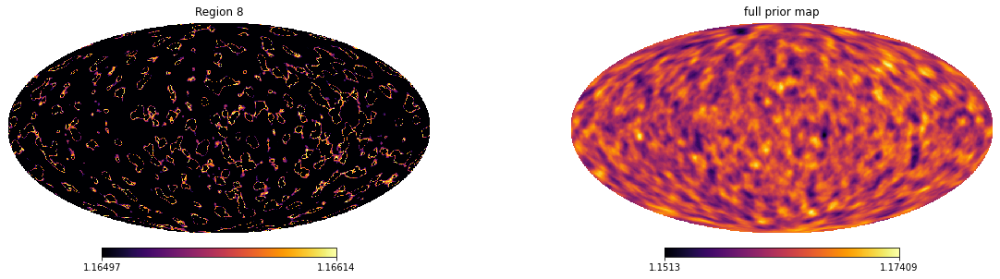

Data map mean  53.90082724962398  original map mean  46.18452142862467
Ratio of 1.1670755825179304


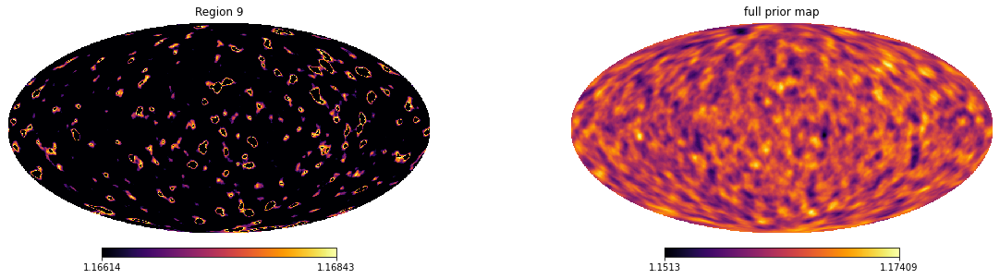

Data map mean  12.747018370348085  original map mean  10.900220222048423
Ratio of 1.169427599688679


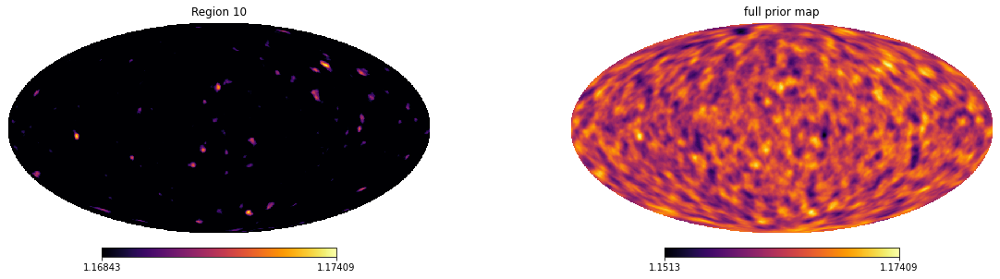

the temperature dividers are  11  long 
The max of the map is  509.37593221329064
dividing percentiles are  1.0
dividing percentiles are  13.0
dividing percentiles are  25.0
dividing percentiles are  37.0
dividing percentiles are  49.0
dividing percentiles are  61.0
dividing percentiles are  73.0
dividing percentiles are  85.0
dividing percentiles are  97.0
the temperature dividers are  [ 14.71998178  15.02795082  19.23903754  21.95340719  24.85714719
  28.22850707  33.03257075  40.04430215  53.62828752 136.55284126
 509.37593221]
values must be between  14.719981783236225  percentile and  15.027950818826625
values must be between  15.027950818826625  percentile and  19.239037536172646
values must be between  19.239037536172646  percentile and  21.95340719461984
values must be between  21.95340719461984  percentile and  24.85714718986204
values must be between  24.85714718986204  percentile and  28.228507070813013
values must be between  28.228507070813013  percentile and  33.032570754

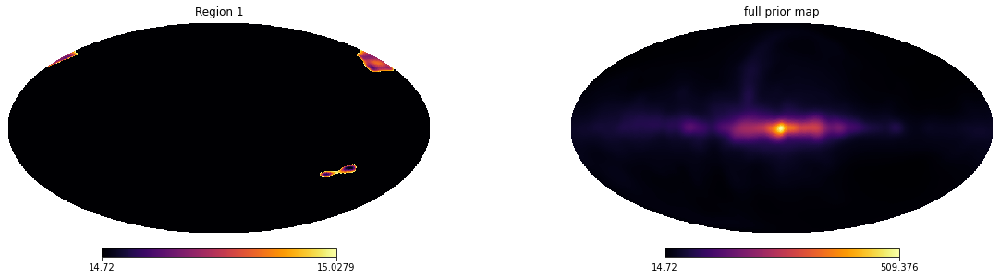

Data map mean  24.375484841566216  original map mean  20.949042922235094
Ratio of 1.1635607856669352


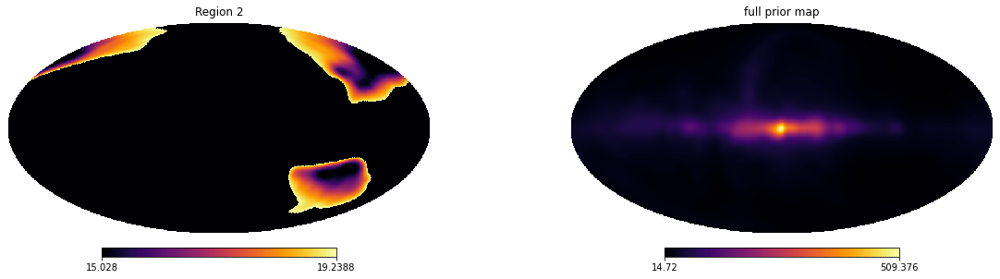

Data map mean  28.53221954348177  original map mean  24.5250928143311
Ratio of 1.1633888507369532


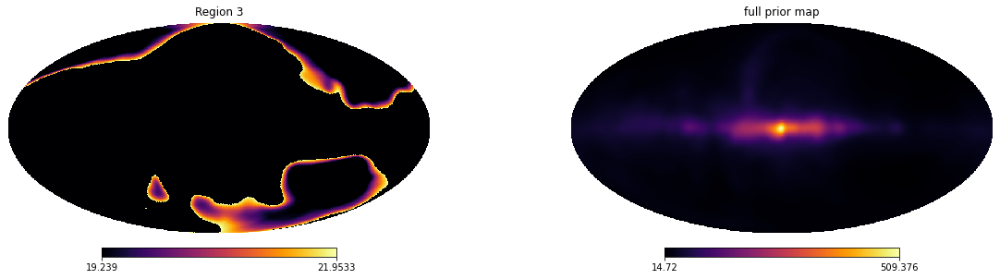

Data map mean  32.45236658840979  original map mean  27.904191724179935
Ratio of 1.1629925320606476


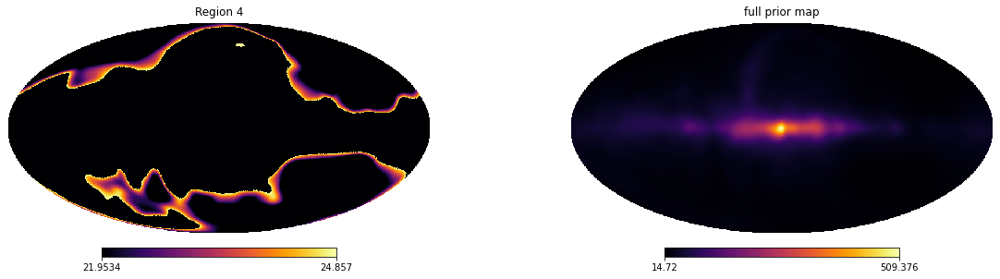

Data map mean  36.947434621804994  original map mean  31.76488918263931
Ratio of 1.16315326678357


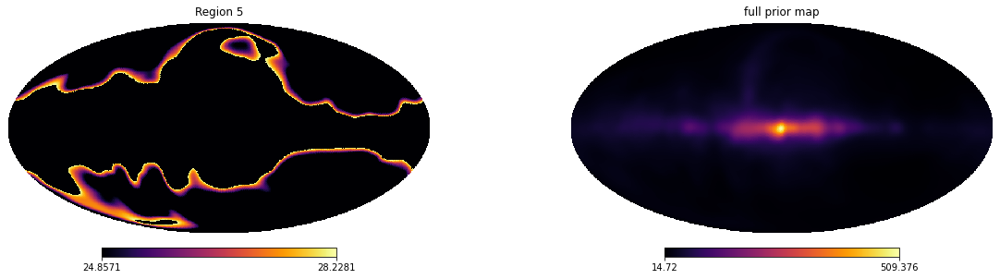

Data map mean  42.516344484713976  original map mean  36.54938031507967
Ratio of 1.163257601584354


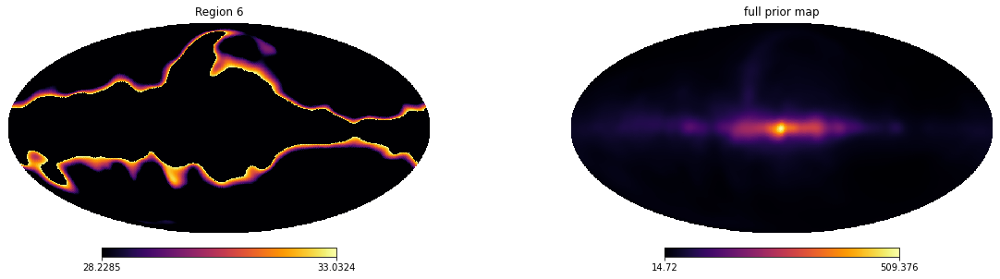

Data map mean  50.41812327074357  original map mean  43.34015464507198
Ratio of 1.1633120297709043


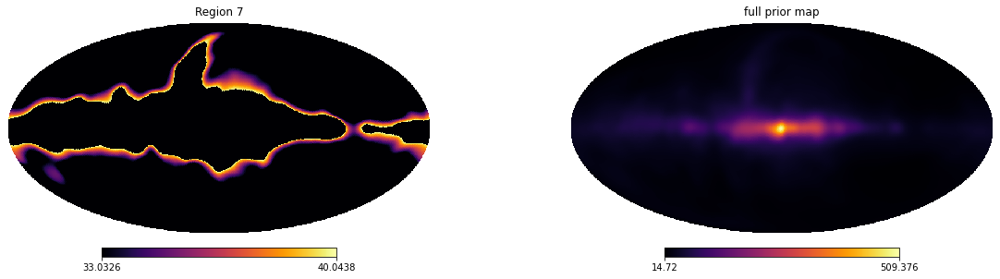

Data map mean  63.157462750875375  original map mean  54.30078206591619
Ratio of 1.1631041091490724


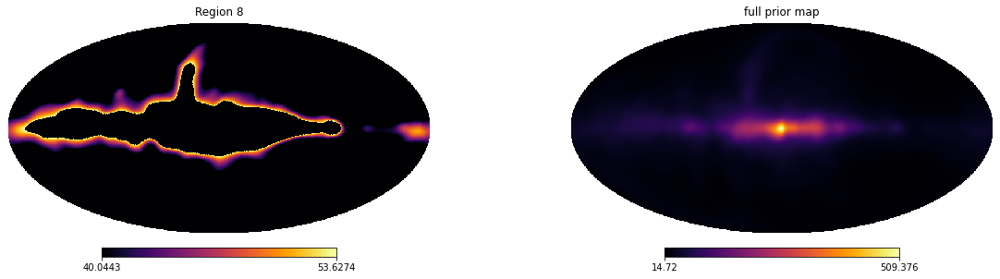

Data map mean  105.54973411074029  original map mean  90.74424433079548
Ratio of 1.1631562408076646


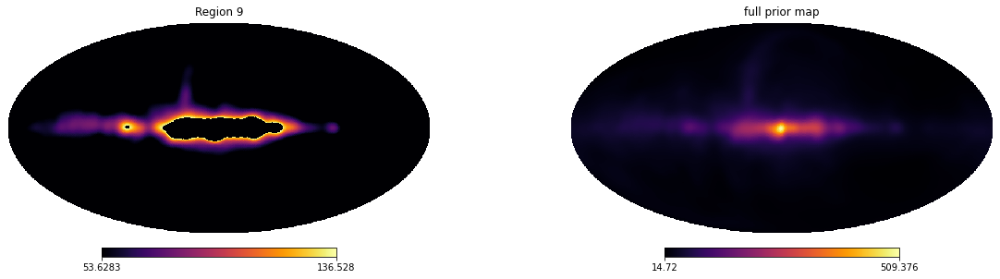

Data map mean  79.3322709985729  original map mean  68.20658975133362
Ratio of 1.1631173950757703


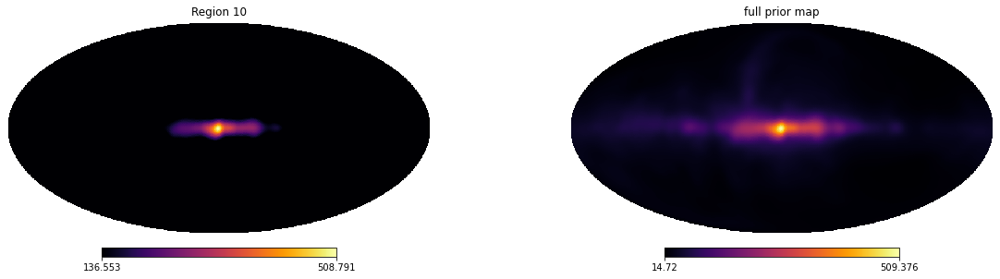

In [38]:

    
    
    
#okay so that is the fractional error map? What about if we used the absolute error map as the prior?
input_map = errors150MHz_nside512


masks = np.zeros((len(input_map), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')

temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    
print('the temperature dividers are ', temp_divider )
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    masked = np.multiply(errors150MHz_nside512 , masks[:,i])
    minval = np.min(masked.flatten()[np.nonzero(masked.flatten())])
    maxval = np.max(masked.flatten()[np.nonzero(masked.flatten())])
    print('Data map mean ', np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i])), ' original map mean ', np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    print('Ratio of' , np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i]))/np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    fig, (ax1, ax2) = pl.subplots(ncols=2, figsize = (20,5))
    pl.axes(ax1)
    hp.visufunc.mollview(np.multiply(errors150MHz_nside512 ,  masks[:,i]) , min = minval, title = 'Region ' + str(i + 1), hold = True, cmap = 'inferno')
    pl.axes(ax2)
    hp.visufunc.mollview(errors150MHz_nside512  , hold = True, title = 'full prior map' , cmap = 'inferno')
    pl.show()
    pl.close()


    

the temperature dividers are  11  long 
The max of the map is  509.37593221329064
dividing percentiles are  1.0
dividing percentiles are  13.0
dividing percentiles are  25.0
dividing percentiles are  37.0
dividing percentiles are  49.0
dividing percentiles are  61.0
dividing percentiles are  73.0
dividing percentiles are  85.0
dividing percentiles are  97.0
the temperature dividers are  [ 14.71998178  15.02795082  19.23903754  21.95340719  24.85714719
  28.22850707  33.03257075  40.04430215  53.62828752 136.55284126
 509.37593221]
values must be between  14.719981783236225  percentile and  15.027950818826625
values must be between  15.027950818826625  percentile and  19.239037536172646
values must be between  19.239037536172646  percentile and  21.95340719461984
values must be between  21.95340719461984  percentile and  24.85714718986204
values must be between  24.85714718986204  percentile and  28.228507070813013
values must be between  28.228507070813013  percentile and  33.032570754

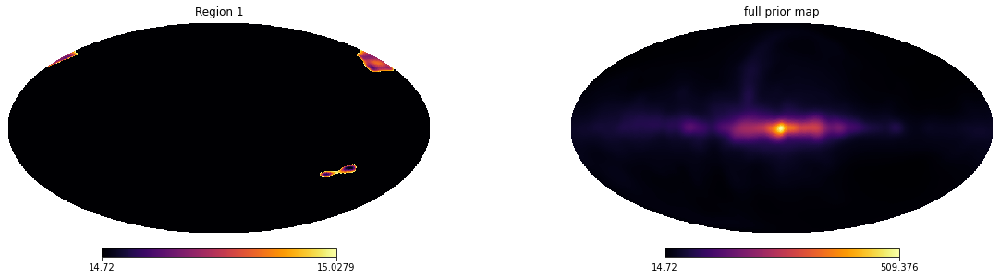

Data map mean  24.375484841566216  original map mean  20.949042922235094
Ratio of 1.1635607856669352


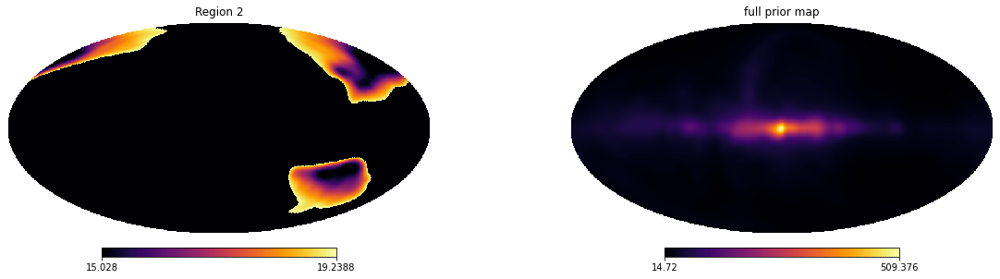

Data map mean  28.53221954348177  original map mean  24.5250928143311
Ratio of 1.1633888507369532


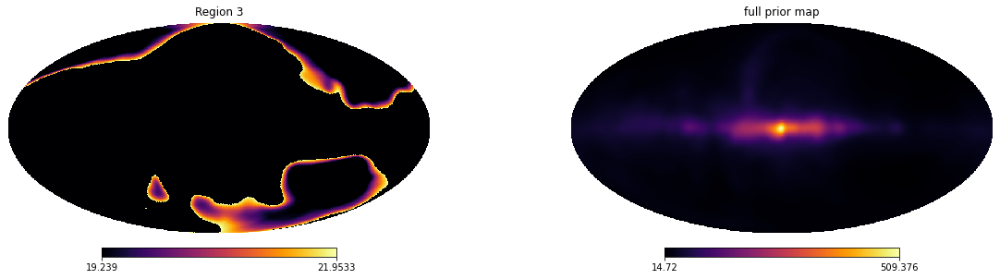

Data map mean  32.45236658840979  original map mean  27.904191724179935
Ratio of 1.1629925320606476


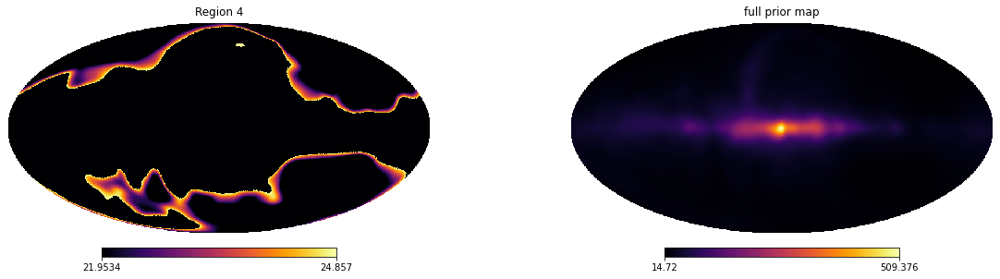

Data map mean  36.947434621804994  original map mean  31.76488918263931
Ratio of 1.16315326678357


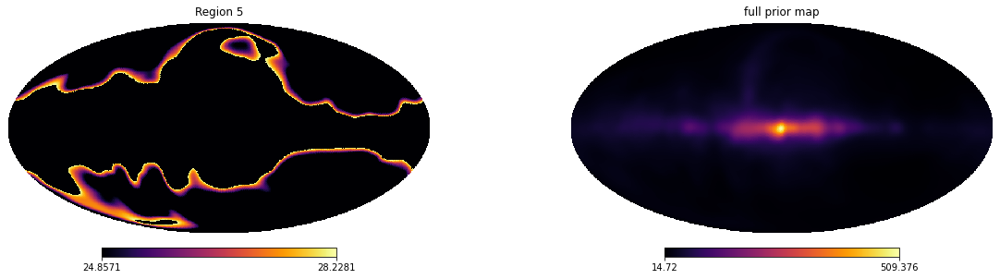

Data map mean  42.516344484713976  original map mean  36.54938031507967
Ratio of 1.163257601584354


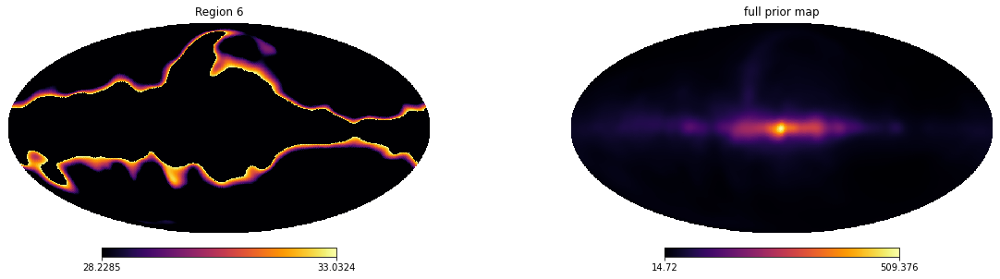

Data map mean  50.41812327074357  original map mean  43.34015464507198
Ratio of 1.1633120297709043


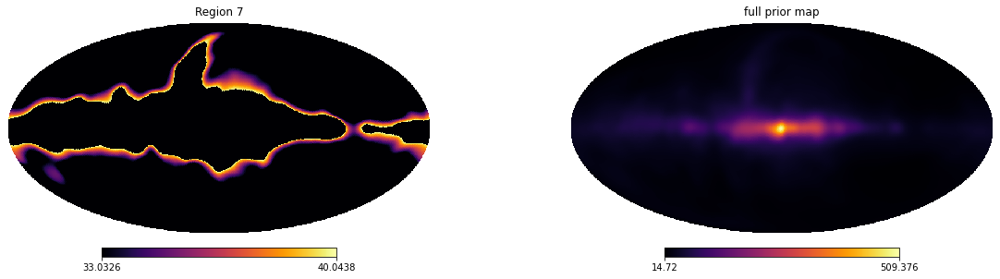

Data map mean  63.157462750875375  original map mean  54.30078206591619
Ratio of 1.1631041091490724


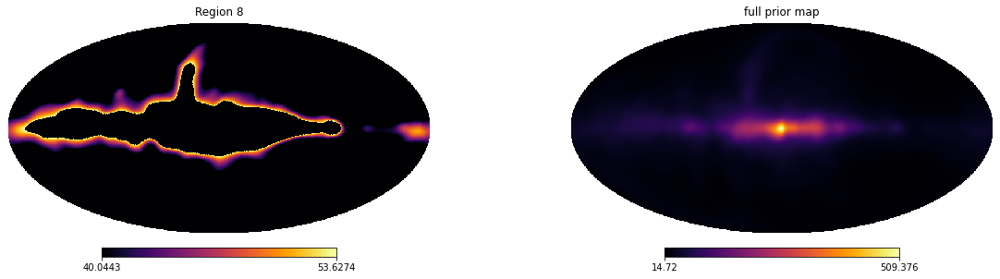

Data map mean  105.54973411074029  original map mean  90.74424433079548
Ratio of 1.1631562408076646


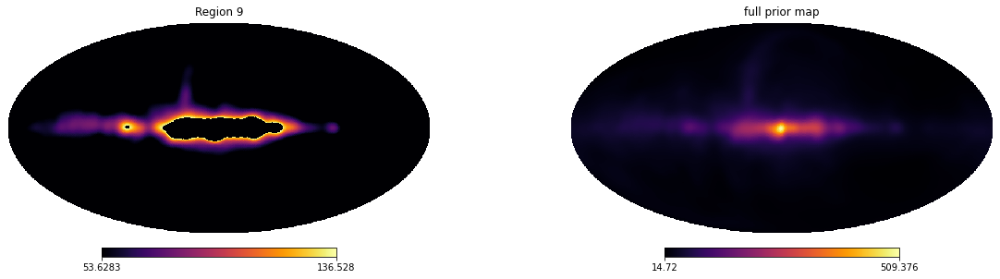

Data map mean  79.3322709985729  original map mean  68.20658975133362
Ratio of 1.1631173950757703


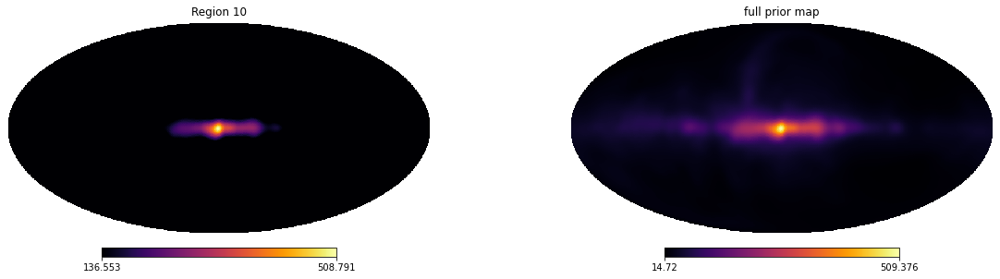

In [173]:
#okay so that is the fractional error map? What about if we used the absolute error map as the prior?
input_map = errors150MHz_nside512


masks = np.zeros((len(input_map), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')

temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    
print('the temperature dividers are ', temp_divider )
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    masked = np.multiply(errors150MHz_nside512 , masks[:,i])
    minval = np.min(masked.flatten()[np.nonzero(masked.flatten())])
    maxval = np.max(masked.flatten()[np.nonzero(masked.flatten())])
    print('Data map mean ', np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i])), ' original map mean ', np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    print('Ratio of' , np.mean(np.multiply(allsky_150MHz_wNoise,masks[:,i]))/np.mean(np.multiply(allsky_150MHz,masks[:,i])))
    fig, (ax1, ax2) = pl.subplots(ncols=2, figsize = (20,5))
    pl.axes(ax1)
    hp.visufunc.mollview(np.multiply(errors150MHz_nside512 ,  masks[:,i]) , min = minval, title = 'Region ' + str(i + 1), hold = True, cmap = 'inferno')
    pl.axes(ax2)
    hp.visufunc.mollview(errors150MHz_nside512  , hold = True, title = 'full prior map' , cmap = 'inferno')
    pl.show()
    pl.close()


    

# End Sanity Checks

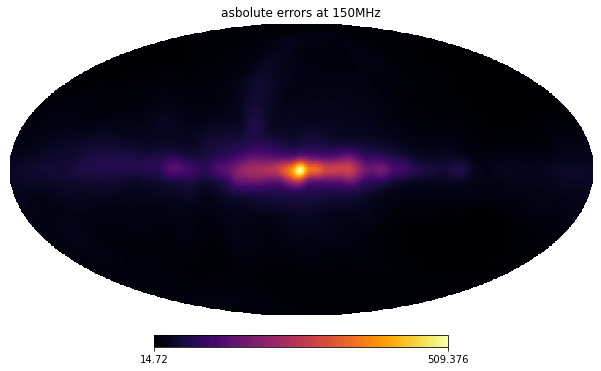

In [26]:
hp.visufunc.mollview(errors150MHz_nside512 , cmap = 'inferno',   title = 'asbolute errors at 150MHz')

#np.save('AbsoluteErrors150MHz_14K_509K_RayleighJeans.npy', errors150MHz_nside512)

## Gaussian Errors

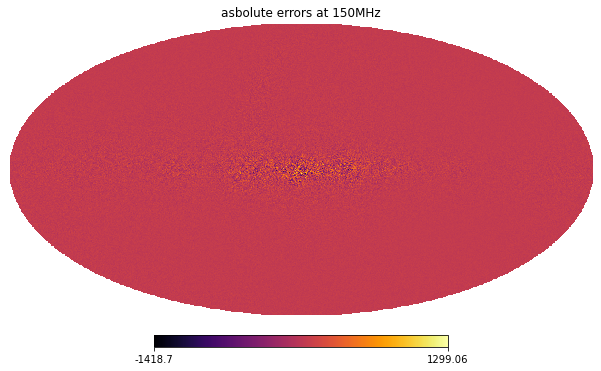

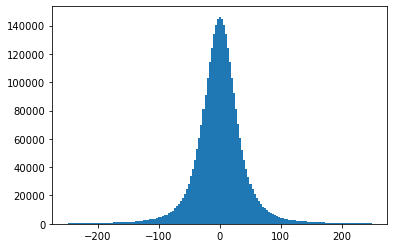

In [20]:
#errors150MHz_nside512_Gaussian = np.zeros_like(errors150MHz_nside512)
#for i in range(len(errors150MHz_nside512)):
#    errors150MHz_nside512_Gaussian[i] = np.random.normal(0,errors150MHz_nside512[i])
    
    
hp.visufunc.mollview(errors150MHz_nside512_Gaussian , cmap = 'inferno',   title = 'asbolute errors at 150MHz')
pl.show()
pl.close()
pl.hist(errors150MHz_nside512_Gaussian, bins = np.linspace(-250, 250, 150))
pl.show()
pl.close()

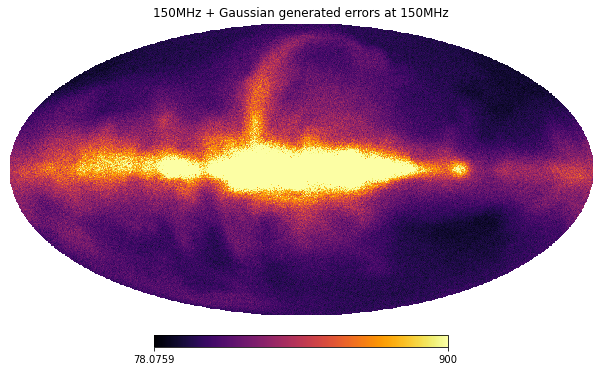

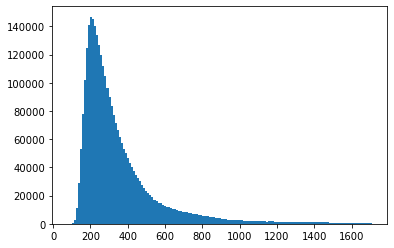

Mean of the noisy map is 399.80432883344525 compared to the original 399.7996


In [21]:
#150Mhz  + Gaussian noise
allsky_150MHz_wGaussianNoise = allsky_150MHz + errors150MHz_nside512_Gaussian

hp.visufunc.mollview(allsky_150MHz_wGaussianNoise , cmap = 'inferno', max = 900, title = '150MHz + Gaussian generated errors at 150MHz')
pl.show()
pl.close()
pl.hist(allsky_150MHz_wGaussianNoise, bins = np.linspace(np.min(allsky_150MHz_wGaussianNoise),np.max(allsky_150MHz_wGaussianNoise)/5., 150))
pl.show()
pl.close()

print('Mean of the noisy map is ' + str(np.mean(allsky_150MHz_wGaussianNoise)) + ' compared to the original ' + str(mean_allsky_150MHz) )

#save noise and original
#np.save('allsky_150MHz_wGaussianNoiseFromAbsoluteErrorMapRayleighJeans.npy', allsky_150MHz_wGaussianNoise)
#np.save('allsky_150MHz.npy', allsky_150MHz)
#np.save('GaussianNoiseFromAbsoluteErrorMapRayleighJeans.npy', errors150MHz_nside512_Gaussian)


In [ ]:
#cool no mean change

the temperature dividers are  5  long 
The max of the map is  1790.553393349954
dividing percentiles are  1.0
the temperature dividers are  [-1515.02582753  -156.06850895     0.             0.
  1790.55339335]
dividing percentiles are  49.0
the temperature dividers are  [-1.51502583e+03 -1.56068509e+02 -7.22053715e-01  0.00000000e+00
  1.79055339e+03]
dividing percentiles are  97.0
the temperature dividers are  [-1.51502583e+03 -1.56068509e+02 -7.22053715e-01  8.60749591e+01
  1.79055339e+03]
values must be between  -1515.0258275272233  percentile and  -156.0685089503775
values must be between  -156.0685089503775  percentile and  -0.7220537148695534
values must be between  -0.7220537148695534  percentile and  86.07495910257028


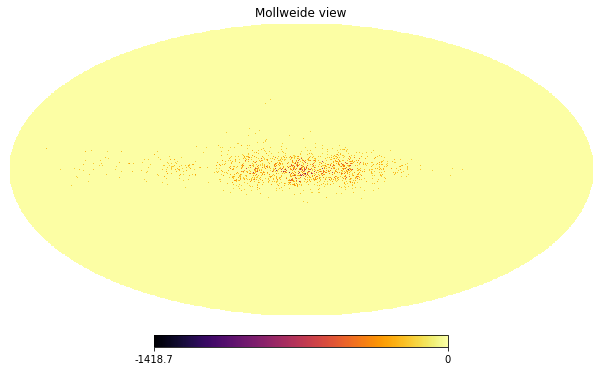

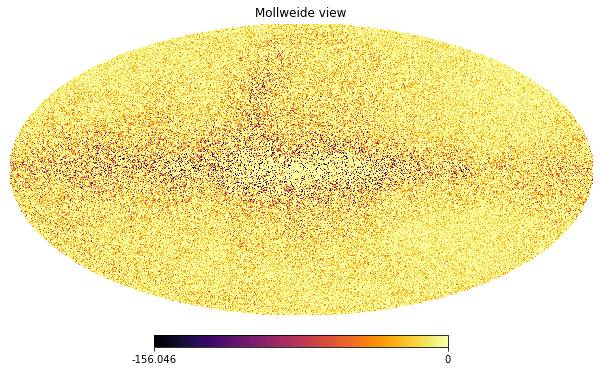

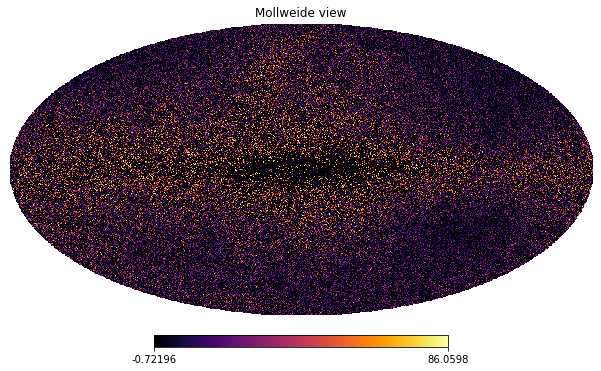

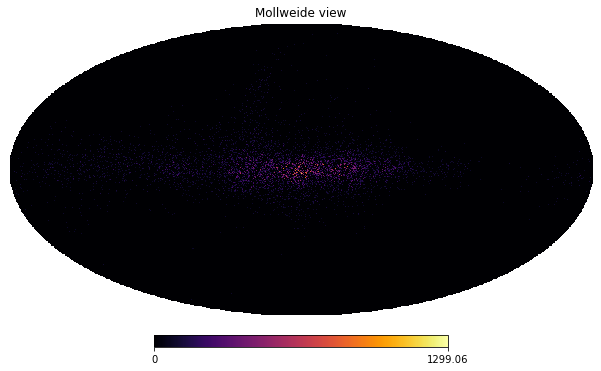

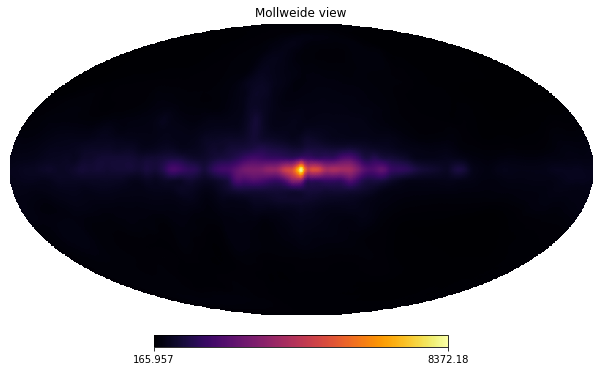

In [23]:
N_reg_scafac = 4
input_map = errors150MHz_nside512_Gaussian
masks = np.zeros((len(allsky_150MHz), N_reg_scafac))
temp_divider = np.zeros((N_reg_scafac + 1))
print('the temperature dividers are ' , len(temp_divider), ' long ')
temp_divider[0] = np.min(input_map)
temp_divider[-1] = np.max(input_map)

print('The max of the map is ' , temp_divider[-1] )
percentiles = np.linspace(1, 97, int(N_reg_scafac -1 ) )
for i in range(N_reg_scafac - 1):
    print('dividing percentiles are ' , percentiles[i])
    temp_divider[i + 1] = np.percentile(input_map ,  percentiles[i])
    print('the temperature dividers are ', temp_divider )
    
for i in range(N_reg_scafac - 1):
    print('values must be between ' ,temp_divider[i] , ' percentile and ' , temp_divider[i+1] )
    masks[:,i] = np.where((input_map >= temp_divider[i]) & (input_map < temp_divider[i+1]), 1,0 )


masks[:, -1] = np.where((input_map >= temp_divider[-2]) & (input_map < temp_divider[-1]), 1,0 )



for i in range(N_reg_scafac):
    hp.visufunc.mollview(np.multiply(input_map, masks[:,i]) , cmap = 'inferno')
    pl.show()
    pl.close()
    
    
hp.visufunc.mollview(allsky_150MHz_wNoise , cmap = 'inferno')

In [ ]:
#The scale factors would never work for this error map as a prior. 

# Results 

### 0 Scale Factors

In [70]:
!open /Volumes/Tubster/REACH/150MHz/GaussianGeneratedErrorsFromAbsoluteErrorMap/GaussianNoiseGeneratedFromAbsoluteErrorsRayleighJeans_Memo_null_150MHz_Scafac_0_Delta_0.0/analysis/total_comparison.pdf

log(Z)       =   0.190885342854136E+003 +/-   0.874789125815565E+000

### 1 Scale Factor

In [71]:
!open /Volumes/Tubster/REACH/150MHz/GaussianGeneratedErrorsFromAbsoluteErrorMap/GaussianNoiseGeneratedFromAbsoluteErrorsRayleighJeans_Memo_null_150MHz_Nscafac_1/analysis/total_comparison.pdf

In [ ]:
#Reconstructed map

log(Z)       =   0.294402218164113E+003 +/-   0.471904620470143E+000

Dim No.       Mean        Sigma
  1  0.269995674962539E+001 +/-   0.154058141777049E-004
  2  0.100026245057991E+001 +/-   0.164314845249504E-004
  3  0.120982663179722E+003 +/-   0.152224445750980E+002
  4  0.429514324918844E+002 +/-   0.801823486892333E+001
  5  0.271207923156267E-001 +/-   0.106569982863158E-001
  6  0.253134780584528E-001 +/-   0.493309809102490E-003

errors150MHz_nside512_Gaussian
allsky_150MHz_wGaussianNoise = allsky_150MHz + errors150MHz_nside512_Gaussian

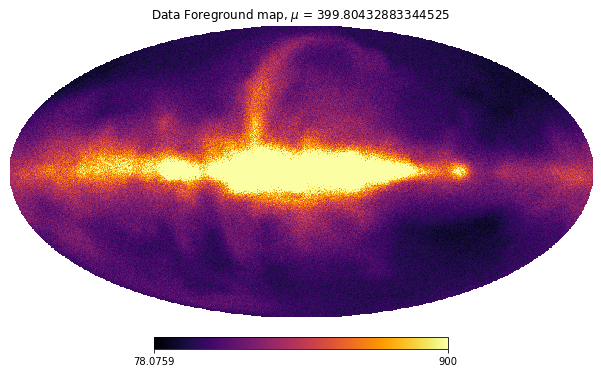

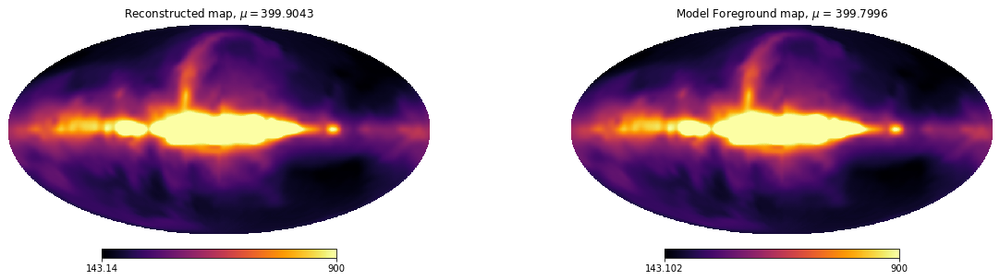

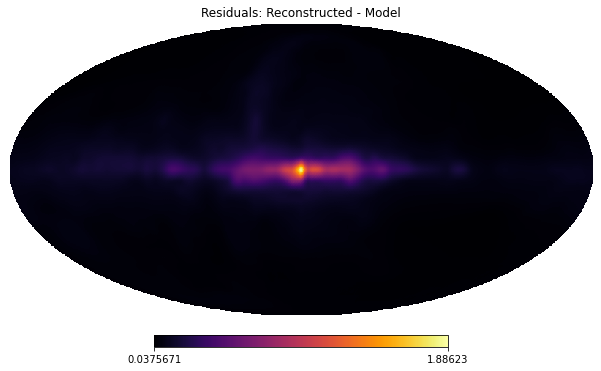

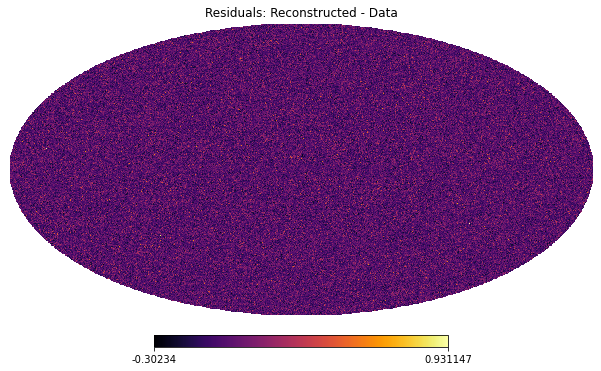

In [40]:
amp_scale_factor = 0.100026245057991e1
vmax = 900
reconstructed_map = amp_scale_factor*allsky_150MHz


mean_original = np.mean(allsky_150MHz)
mean_reconstructed = np.mean(reconstructed_map)
mean_allsky_150MHz_wGaussianNoise = np.mean(allsky_150MHz_wGaussianNoise)
#hp.visufunc.mollview(reconstructed_map , cmap = 'inferno', title = r'Reconstructed map, $\mu = $' + str(mean_reconstructed))
hp.visufunc.mollview(allsky_150MHz_wGaussianNoise , max = vmax, cmap = 'inferno', title = r'Data Foreground map, $\mu$ = ' + str(mean_allsky_150MHz_wGaussianNoise))


fig, (ax1, ax2) = pl.subplots(ncols=2, figsize = (20,5))
pl.axes(ax1)
hp.visufunc.mollview(reconstructed_map , max = vmax, hold = True, cmap = 'inferno', title = r'Reconstructed map, $\mu = $' + str(mean_reconstructed))
pl.axes(ax2)
hp.visufunc.mollview(allsky_150MHz , max = vmax, hold = True, cmap = 'inferno', title = r'Model Foreground map, $\mu$ = ' + str(mean_original))

pl.show()
pl.close()

hp.visufunc.mollview(reconstructed_map-allsky_150MHz  ,   cmap = 'inferno', title = r'Residuals: Reconstructed - Model')

hp.visufunc.mollview( np.true_divide(reconstructed_map- allsky_150MHz_wGaussianNoise ,allsky_150MHz_wGaussianNoise ) ,   cmap = 'inferno', title = r'Residuals: Reconstructed - Data')


